In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# data imports

* Residential Energy Consumption Survey (RECS) - Residential Energy Consumption Survey (RECS)
* Starting from the survey on US household consumption(https://www.eia.gov/consumption/residential/data/2020/index.php?view=microdata&utm_source=chatgpt.com), electricity and gas consumption will be analysed for different categories, with the aim of classifying consumers into clusters based on this two main energy sources

In [2]:
np.random.seed(42)

In [3]:
energy_complete = pd.read_csv('recs2020.csv')

In [4]:
energy_complete

,DOEID,REGIONC,DIVISION,STATE_FIPS,state_postal,state_name,BA_climate,IECC_climate_code,UATYP10,HDD65,...,EVCHRGHOME,EVCHRGAPT,EVCHRGWKS,EVCHRGBUS,EVCHRGMUNI,EVCHRGDLR,EVCHRGHWY,EVCHRGOTH,EVHOMEAMT,EVCHRGTYPE
0,100001,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3844,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
1,100002,SOUTH,West South Central,5,AR,Arkansas,Mixed-Humid,4A,U,3766,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
2,100003,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3819,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
3,100004,SOUTH,South Atlantic,45,SC,South Carolina,Mixed-Humid,3A,U,2614,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
4,100005,NORTHEAST,Middle Atlantic,34,NJ,New Jersey,Mixed-Humid,4A,U,4219,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18491,118492,SOUTH,South Atlantic,24,MD,Maryland,Mixed-Humid,4A,U,4572,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18492,118493,NORTHEAST,New England,23,ME,Maine,Very-Cold,7A,R,9861,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18493,118494,SOUTH,West South Central,48,TX,Texas,Hot-Humid,2A,U,405,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18494,118495,SOUTH,South Atlantic,45,SC,South Carolina,Hot-Humid,3A,U,1245,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0


In [5]:
energy_complete.columns

Index(['DOEID', 'REGIONC', 'DIVISION', 'STATE_FIPS', 'state_postal',
       'state_name', 'BA_climate', 'IECC_climate_code', 'UATYP10', 'HDD65',
       ...
       'EVCHRGHOME', 'EVCHRGAPT', 'EVCHRGWKS', 'EVCHRGBUS', 'EVCHRGMUNI',
       'EVCHRGDLR', 'EVCHRGHWY', 'EVCHRGOTH', 'EVHOMEAMT', 'EVCHRGTYPE'],
      dtype='object', length=799)

In [6]:
energy_complete.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18496 entries, 0 to 18495
Columns: 799 entries, DOEID to EVCHRGTYPE
dtypes: float64(243), int64(549), object(7)
memory usage: 112.7+ MB


## selecting the features

* 1 Mobile home
* 2 Single-family house detached from any other house 
* 3 Single-family house attached to one or more other houses (for example: duplex, row house, or townhome)
* 4 Apartment in a building with 2 to 4 units
* 5 Apartment in a building with 5 or more units

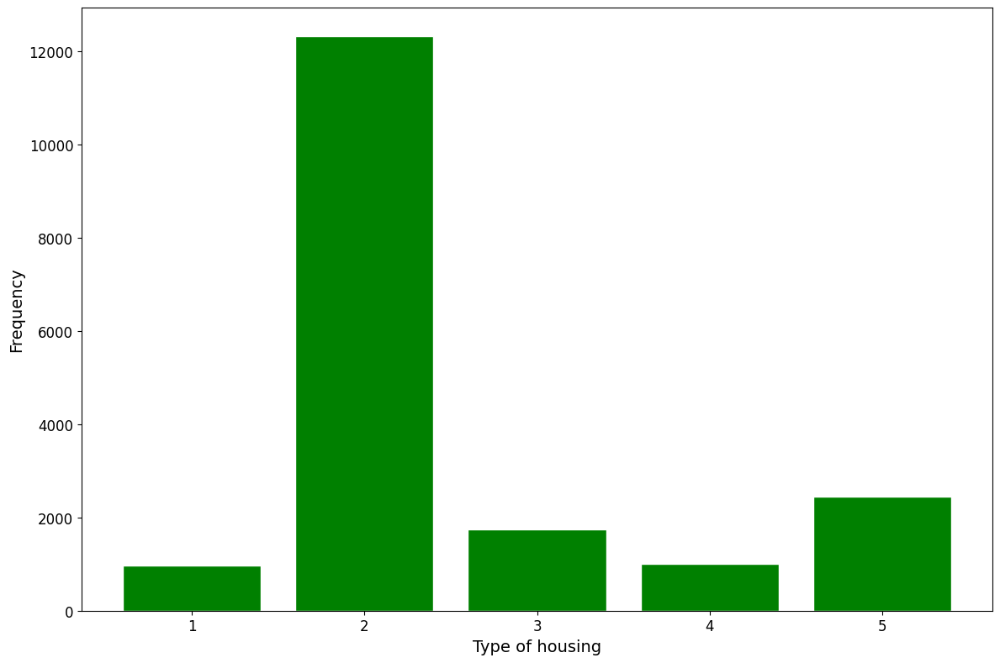

In [7]:
counts = energy_complete['TYPEHUQ'].value_counts().sort_index()

plt.figure(figsize=(12, 8))
plt.bar(counts.index.astype(str), counts.values, color='green', edgecolor='white')

plt.xlabel('Type of housing', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [8]:
energy_complete = energy_complete[energy_complete['TYPEHUQ'] == 2.0]

In [9]:
energy_complete

,DOEID,REGIONC,DIVISION,STATE_FIPS,state_postal,state_name,BA_climate,IECC_climate_code,UATYP10,HDD65,...,EVCHRGHOME,EVCHRGAPT,EVCHRGWKS,EVCHRGBUS,EVCHRGMUNI,EVCHRGDLR,EVCHRGHWY,EVCHRGOTH,EVHOMEAMT,EVCHRGTYPE
0,100001,WEST,Mountain South,35,NM,New Mexico,Mixed-Dry,4B,U,3844,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
3,100004,SOUTH,South Atlantic,45,SC,South Carolina,Mixed-Humid,3A,U,2614,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
5,100006,SOUTH,West South Central,48,TX,Texas,Hot-Humid,2A,U,901,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
6,100007,SOUTH,West South Central,40,OK,Oklahoma,Mixed-Humid,3A,U,3148,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
10,100011,WEST,Pacific,6,CA,California,Hot-Dry,3B,U,1467,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18488,118489,SOUTH,South Atlantic,12,FL,Florida,Hot-Humid,2A,R,184,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18489,118490,SOUTH,South Atlantic,51,VA,Virginia,Mixed-Humid,4A,R,4856,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18492,118493,NORTHEAST,New England,23,ME,Maine,Very-Cold,7A,R,9861,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0
18494,118495,SOUTH,South Atlantic,45,SC,South Carolina,Hot-Humid,3A,U,1245,...,-2.0,-2,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0


* 0 Not imputed
* 1 Imputed amount and cost
* 2 Imputed only amount for SOLAR=1 cases

In [10]:
energy_complete['ZELAMOUNT'].value_counts() # electricty

ZELAMOUNT
0    11054
1      893
2      372
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no natural gas use

In [11]:
energy_complete['ZNGAMOUNT'].value_counts() # gas

ZNGAMOUNT
 0    7012
-2    4565
 1     742
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no propane use

In [12]:
energy_complete['ZLPAMOUNT'].value_counts() # propane

ZLPAMOUNT
-2    10703
 1      843
 0      773
Name: count, dtype: int64

* 0 Not imputed
* 1 Imputed amount and cost
* -2 Not applicable, no fuel oil/kerosene use

In [13]:
energy_complete['ZFOAMOUNT'].value_counts() # oil/kerosene

ZFOAMOUNT
-2    11339
 0      561
 1      419
Name: count, dtype: int64

In [14]:
cols_to_keep = [ 
                # Electricity usage measured in kilowatt-hours
                'KWHSPH', # Calibrated electricity usage for space heating, main and secondary, in kilowatt-hours, 2020
                'KWHCOL', # Calibrated electricity usage for space cooling (central air conditioning, individual units, and evaporative coolers), in kilowatthours, 2020
                'KWHAHUHEAT', # Calibrated electricity usage for distributing space heating via furnace fans and boiler pumps, in kilowatt-hours, 2020
                'KWHAHUCOL', # Calibrated electricity usage for furnace fans used for cooling, in kilowatt-hours, 2020
                'KWHWTH', # Calibrated electricity usage for water heating, main and secondary, in kilowatthours, 2020 
                'KWHRFG', # Calibrated electricity usage for all refrigerators, in kilowatthours, 2020
                'KWHFRZ', # Calibrated electricity usage for freezers, in kilowatt-hours, 2020
                'KWHCOK', # Calibrated electricity usage for cooking (cooktops, ovens, and ranges), in kilowatt-hours, 2020
                'KWHMICRO', # Calibrated electricity usage for microwaves, in kilowatt-hours, 2020
                'KWHCW', # Calibrated electricity usage for clothes washers, in kilowatt-hours, 2020
                'KWHCDR', # Calibrated electricity usage for clothes dryers, in kilowatt-hours, 2020
                'KWHDWH', # Calibrated electricity usage for dishwashers, in kilowatt-hours, 2020
                'KWHTVREL', # Calibrated electricity usage for televisions and related peripherals, in kilowatt-hours, 2020

                
                # Gas usage measured in thousand BTU
                'BTUNGSPH', # Calibrated natural gas usage for space heating, main and secondary, in thousand Btu, 2020
                'BTUNGWTH', # Calibrated natural gas usage for water heating, main and secondary, in thousand Btu, 2020
                'BTUNGCOK', # Calibrated natural gas usage for cooking (cooktops, ovens, and ranges), in thousand Btu, 2020
                'BTUNGOTH', # Calibrated natural gas usage for end uses other than space heating and water heating, in thousand Btu, 2020
                

                'TOTSQFT_EN' # Total energy-consuming area (square footage) of the housing unit. Includes all main living areas; all basements; heated, cooled, or finished attics; and heating or cooled garages
]

In [15]:
energy = energy_complete[cols_to_keep].copy()

In [16]:
energy['Tot_heating_elec'] = energy['KWHSPH'] + energy['KWHAHUHEAT']

In [17]:
energy['Tot_cooling_elec'] = energy['KWHCOL'] + energy['KWHAHUCOL']

In [18]:
energy['Tot_refrigeretor_elec'] = energy['KWHRFG'] + energy['KWHFRZ']

In [19]:
energy['Tot_cooking_elec'] = energy['KWHCOK'] + energy['KWHMICRO']

In [20]:
energy['Tot_appliances_elec'] = energy['KWHCW'] + energy['KWHCDR'] + energy['KWHDWH'] + energy['KWHTVREL']

In [21]:
energy.rename(columns={'KWHWTH':'Tot_waterheat_elec', 'BTUNGSPH':'Tot_heating_gas',
                       'BTUNGWTH':'Tot_waterheat_gas','BTUNGCOK':'Tot_cooking_gas',
                       'BTUNGOTH':'Tot_appliances_gas'},inplace=True)

In [22]:
gas_cols = ['Tot_heating_gas', 'Tot_waterheat_gas', 'Tot_cooking_gas', 'Tot_appliances_gas']

# conversion from kBtu to kWh
for col in gas_cols:
    energy[col] = energy[col] * 0.29307107

In [23]:
energy.drop([
            'KWHSPH', # Calibrated electricity usage for space heating, main and secondary, in kilowatt-hours, 2020
            'KWHCOL', # Calibrated electricity usage for space cooling (central air conditioning, individual units, and evaporative coolers), in kilowatthours, 2020
            'KWHAHUHEAT', # Calibrated electricity usage for distributing space heating via furnace fans and boiler pumps, in kilowatt-hours, 2020
            'KWHAHUCOL', # Calibrated electricity usage for furnace fans used for cooling, in kilowatt-hours, 2020
            'KWHRFG', # Calibrated electricity usage for all refrigerators, in kilowatthours, 2020
            'KWHFRZ', # Calibrated electricity usage for freezers, in kilowatt-hours, 2020
            'KWHCOK', # Calibrated electricity usage for cooking (cooktops, ovens, and ranges), in kilowatt-hours, 2020
            'KWHMICRO', # Calibrated electricity usage for microwaves, in kilowatt-hours, 2020
            'KWHCW', # Calibrated electricity usage for clothes washers, in kilowatt-hours, 2020
            'KWHCDR', # Calibrated electricity usage for clothes dryers, in kilowatt-hours, 2020
            'KWHDWH', # Calibrated electricity usage for dishwashers, in kilowatt-hours, 2020
            'KWHTVREL', # Calibrated electricity usage for televisions and related peripherals, in kilowatt-hours, 2020
],axis=1,inplace=True)

In [24]:
energy

,Tot_waterheat_elec,Tot_heating_gas,Tot_waterheat_gas,Tot_cooking_gas,Tot_appliances_gas,TOTSQFT_EN,Tot_heating_elec,Tot_cooling_elec,Tot_refrigeretor_elec,Tot_cooking_elec,Tot_appliances_elec
0,0.00,21670.313811,6225.222242,1975.559845,1975.559845,2100,309.06,3920.66,1767.81,374.14,3847.64
3,0.00,9552.812716,6172.431350,428.434736,428.434736,2100,3308.71,1760.83,965.40,473.72,1718.97
5,0.00,4267.522148,5717.294909,0.000000,692.597275,4520,89.56,8272.06,1374.54,1315.51,632.31
6,0.00,20104.854175,4064.154271,0.000000,0.000000,2100,3751.47,5675.82,707.12,540.04,1902.81
10,0.00,6511.672837,2997.809321,0.000000,0.000000,1630,161.44,2767.98,1310.01,129.82,641.97
...,...,...,...,...,...,...,...,...,...,...,...
18488,1761.98,0.000000,0.000000,0.000000,0.000000,2490,0.00,4602.96,1887.11,449.72,1643.96
18489,261.84,0.000000,0.000000,0.000000,0.000000,1850,573.89,121.95,120.09,72.50,228.00
18492,0.00,0.000000,0.000000,0.000000,0.000000,3070,1468.09,938.13,610.62,254.21,527.51
18494,1603.47,0.000000,0.000000,0.000000,0.000000,3000,1469.98,6742.96,2140.54,196.55,511.59


<Axes: >

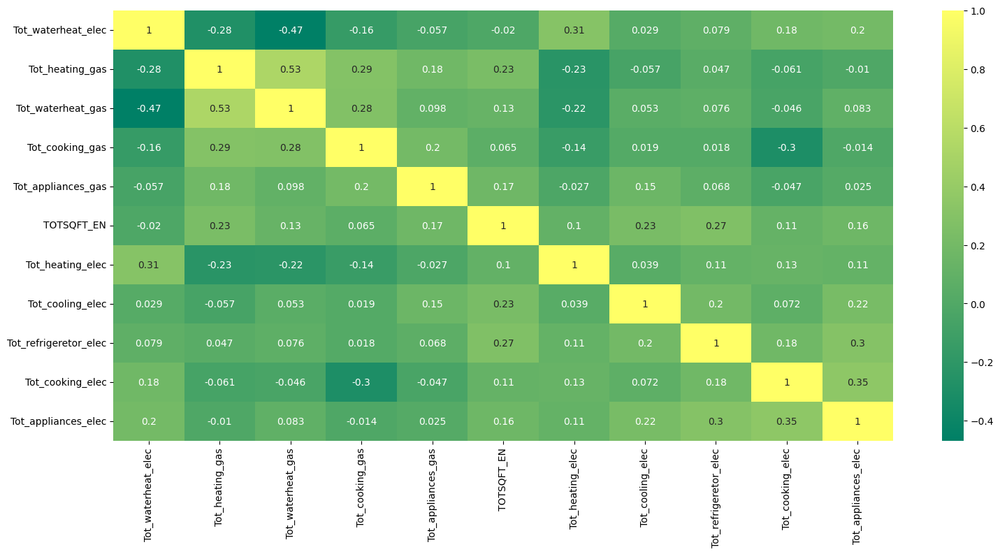

In [25]:
plt.figure(figsize=(18,8))
sns.heatmap(energy.corr(),cmap='summer',annot=True)

In [26]:
for col in energy.columns:
    if col != 'TOTSQFT_EN':
        energy[col + '_EUI'] = energy[col] / energy['TOTSQFT_EN']

In [27]:
energy.drop('TOTSQFT_EN',axis=1,inplace=True)

In [28]:
for col in energy.columns:
    if 'EUI' not in col:
        energy.drop(col,axis=1,inplace=True)

In [29]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
0,0.000000,10.319197,2.964392,0.940743,0.940743,0.147171,1.866981,0.841814,0.178162,1.832210
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
...,...,...,...,...,...,...,...,...,...,...
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827
18494,0.534490,0.000000,0.000000,0.000000,0.000000,0.489993,2.247653,0.713513,0.065517,0.170530


<Axes: >

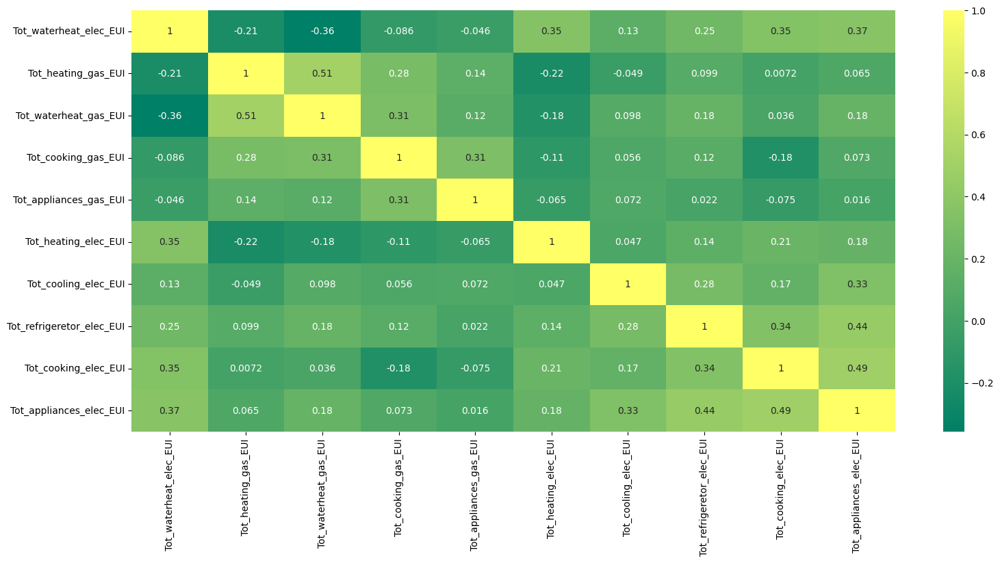

In [30]:
plt.figure(figsize=(18,8))
sns.heatmap(energy.corr(),cmap='summer',annot=True)

## missing values and duplicates

In [31]:
energy.isna().sum()

Tot_waterheat_elec_EUI       0
Tot_heating_gas_EUI          0
Tot_waterheat_gas_EUI        0
Tot_cooking_gas_EUI          0
Tot_appliances_gas_EUI       0
Tot_heating_elec_EUI         0
Tot_cooling_elec_EUI         0
Tot_refrigeretor_elec_EUI    0
Tot_cooking_elec_EUI         0
Tot_appliances_elec_EUI      0
dtype: int64

In [32]:
energy.duplicated().sum()

0

## outlier removal

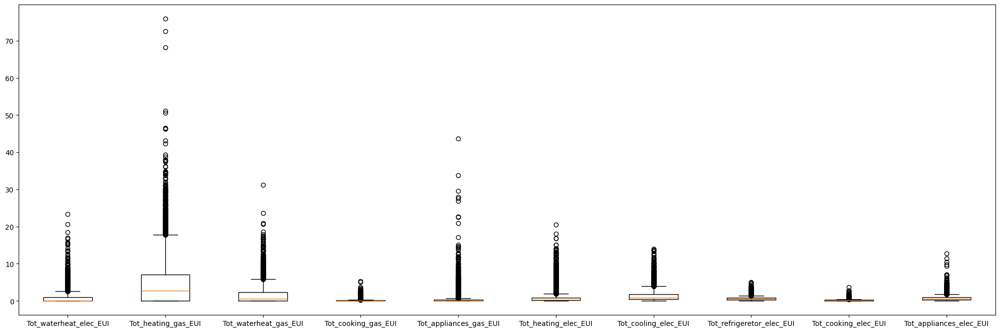

In [33]:
plt.figure(figsize=(25,8))
plt.boxplot(energy,tick_labels=energy.columns)
plt.show()

In [34]:
Q1 = energy.quantile(0.25)
Q3 = energy.quantile(0.75)
IQR = Q3 - Q1

energy = energy[~((energy < (Q1 - 1.5 * IQR)) | (energy > (Q3 + 1.5 * IQR))).any(axis=1)]

In [35]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
11,0.000000,5.905428,1.669820,0.211160,0.211160,0.000000,2.009019,0.617831,0.059091,1.254344
...,...,...,...,...,...,...,...,...,...,...
18487,1.406165,0.000000,0.000000,0.000000,0.000000,0.084565,1.519541,0.865071,0.124429,1.248035
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827


## data standardization

In [36]:
energy

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
3,0.000000,4.548958,2.939253,0.204017,0.204017,1.575576,0.838490,0.459714,0.225581,0.818557
5,0.000000,0.944142,1.264888,0.000000,0.153229,0.019814,1.830102,0.304102,0.291042,0.139892
6,0.000000,9.573740,1.935312,0.000000,0.000000,1.786414,2.702771,0.336724,0.257162,0.906100
10,0.000000,3.994891,1.839147,0.000000,0.000000,0.099043,1.698147,0.803687,0.079644,0.393847
11,0.000000,5.905428,1.669820,0.211160,0.211160,0.000000,2.009019,0.617831,0.059091,1.254344
...,...,...,...,...,...,...,...,...,...,...
18487,1.406165,0.000000,0.000000,0.000000,0.000000,0.084565,1.519541,0.865071,0.124429,1.248035
18488,0.707622,0.000000,0.000000,0.000000,0.000000,0.000000,1.848578,0.757876,0.180610,0.660225
18489,0.141535,0.000000,0.000000,0.000000,0.000000,0.310211,0.065919,0.064914,0.039189,0.123243
18492,0.000000,0.000000,0.000000,0.000000,0.000000,0.478205,0.305580,0.198899,0.082805,0.171827


In [37]:
scaler = StandardScaler()

In [38]:
energy_scaled = scaler.fit_transform(energy)

In [39]:
np.mean(energy_scaled),np.std(energy_scaled)

(-2.066404952771019e-17, 1.0)

In [40]:
energy_scaled = pd.DataFrame(energy_scaled,columns=energy.columns)

In [41]:
energy_scaled

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921
...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488


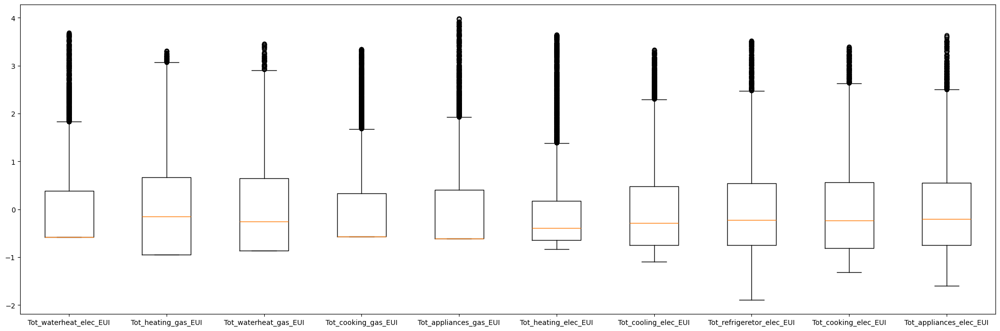

In [42]:
plt.figure(figsize=(25,8))
plt.boxplot(energy_scaled,tick_labels=energy_scaled.columns)
plt.show()

# dimensionality reduction algorithms

## pca 

In [43]:
pca_general = PCA()

In [44]:
pca_general.fit(energy_scaled)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [45]:
explained_variance = pca_general.explained_variance_ratio_

In [46]:
explained_variance

array([0.28032367, 0.18895147, 0.12704675, 0.08532331, 0.08169869,
       0.0685402 , 0.05957754, 0.05518687, 0.03189739, 0.02145411])

In [47]:
eigenvalues = pca_general.explained_variance_

In [48]:
eigenvalues

array([2.80363199, 1.88978112, 1.27064668, 0.85335345, 0.81710212,
       0.68549867, 0.59585945, 0.55194648, 0.31901889, 0.21457139])

In [49]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[2.8036319885511203, 1.889781124146604, 1.270646681554841]


In [50]:
N_COMPONENTS = len(selected_components)

In [51]:
eigenvectors = pca_general.components_

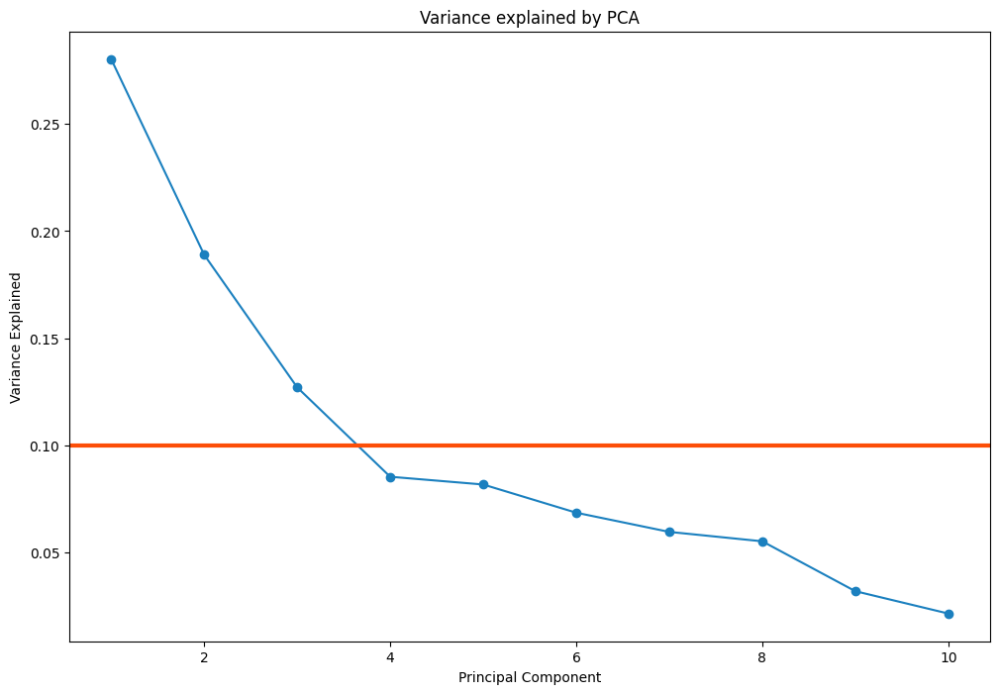

In [52]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [53]:
pca = PCA(n_components=N_COMPONENTS)

In [54]:
X_pca = pca.fit_transform(energy_scaled)

In [55]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [56]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [57]:
X_pca

,dim_1,dim_2,dim_3
0,0.886679,1.363975,1.186636
1,-0.110236,-0.167015,-0.663318
2,-0.966315,2.136664,0.196361
3,0.073670,0.551620,-0.449555
4,1.649792,1.775372,1.256657
...,...,...,...
7087,-2.202718,1.358424,1.035535
7088,-1.573662,0.599975,0.321832
7089,-0.416653,-2.763515,-0.690737
7090,-0.618345,-2.158439,-0.582987


## t-SNE

In [58]:
tsne = TSNE(n_components=3,random_state=42)

In [59]:
X_tsne = tsne.fit_transform(energy_scaled)

In [60]:
tsne_columns = [f'dim_{i+1}' for i in range(3)]

In [61]:
X_tsne = pd.DataFrame(X_tsne, columns=tsne_columns)

In [62]:
X_tsne

,dim_1,dim_2,dim_3
0,2.536473,-0.569887,9.241193
1,-4.466090,7.754672,-10.270030
2,-11.023314,11.286777,-2.401266
3,2.220190,8.093020,-1.315360
4,11.463785,9.571602,4.114413
...,...,...,...
7087,-9.545277,-2.896458,16.773628
7088,-8.877161,-0.713788,7.598481
7089,-6.021173,-15.945735,-2.919369
7090,-5.589542,-12.948777,-2.492481


## umap

In [63]:
umap = umap.UMAP(n_components=3,random_state=42)

In [64]:
X_umap = umap.fit_transform(energy_scaled)

In [65]:
umap_columns = [f'dim_{i+1}' for i in range(3)]

In [66]:
X_umap = pd.DataFrame(X_umap, columns=umap_columns)

In [67]:
X_umap

,dim_1,dim_2,dim_3
0,8.540884,5.635366,8.092696
1,6.674550,7.703112,4.661761
2,8.055438,8.882436,5.173176
3,7.841428,6.987625,5.274173
4,9.224665,5.318230,7.319454
...,...,...,...
7087,0.898640,4.104914,6.800636
7088,0.870373,5.136365,5.973392
7089,-0.109102,8.384296,7.264081
7090,-0.318984,7.911990,6.649530


# clustering algorithms

## k-means 

In [68]:
N_CLUSTER = 3

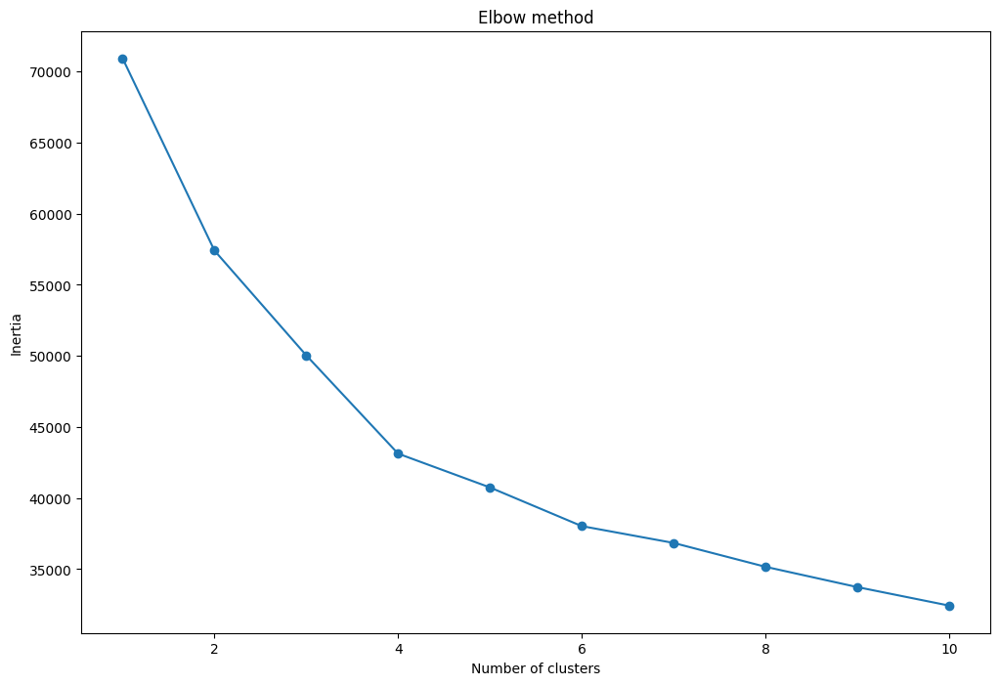

In [69]:
data = energy_scaled
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [70]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [71]:
kmeans.fit(energy_scaled)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [72]:
df_kmeans = energy_scaled.copy()

In [73]:
df_kmeans['k_means'] = kmeans.labels_

In [74]:
df_kmeans

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,k_means
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,2
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,2
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,2
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,1
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,1
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


In [75]:
df_kmeans['k_means'].unique()

array([0, 2, 1])

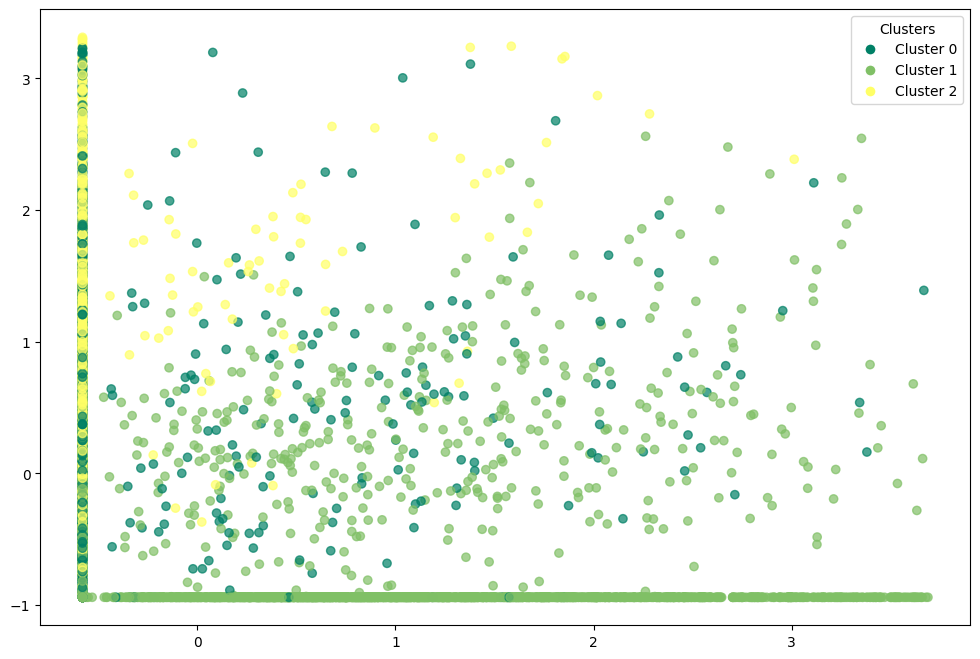

In [76]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [77]:
df_kmeans.groupby(df_kmeans['k_means']).mean() 

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
k_means,,,,,,,,,,
0,-0.439907,0.490604,0.554168,1.478157,1.415801,-0.303353,-0.026190,-0.137221,-0.702599,-0.310206
1,0.600715,-0.745497,-0.824494,-0.520255,-0.542852,0.319403,-0.056557,-0.020911,0.087687,-0.014640
2,-0.541543,0.716199,0.782857,-0.406187,-0.322876,-0.232541,0.104916,0.140525,0.430181,0.269196


In [78]:
sil = silhouette_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])
ch = calinski_harabasz_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])
db = davies_bouldin_score(df_kmeans.iloc[:,:-1], df_kmeans['k_means'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.18032797325729152
Calinski-Harabasz: 1530.9285773732008
Davies-Bouldin: 1.8497345146138162


### k-means with pca

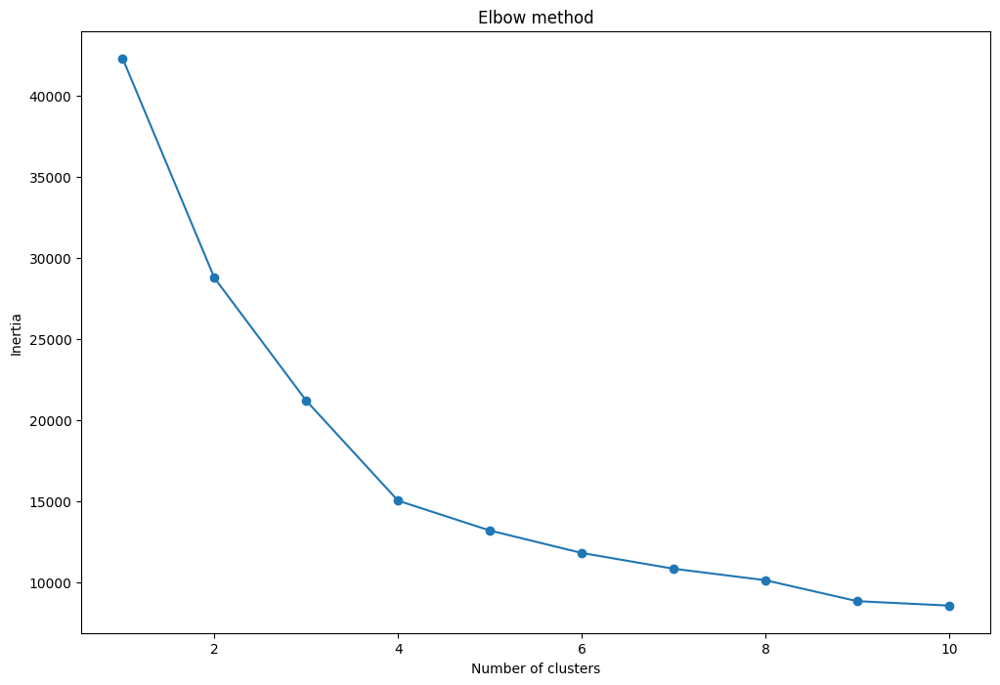

In [79]:
data = X_pca
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [80]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [81]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [82]:
df_pca_kmeans = X_pca.copy()

In [83]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [84]:
df_pca_kmeans

,dim_1,dim_2,dim_3,kmeans_pca
0,0.886679,1.363975,1.186636,0
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


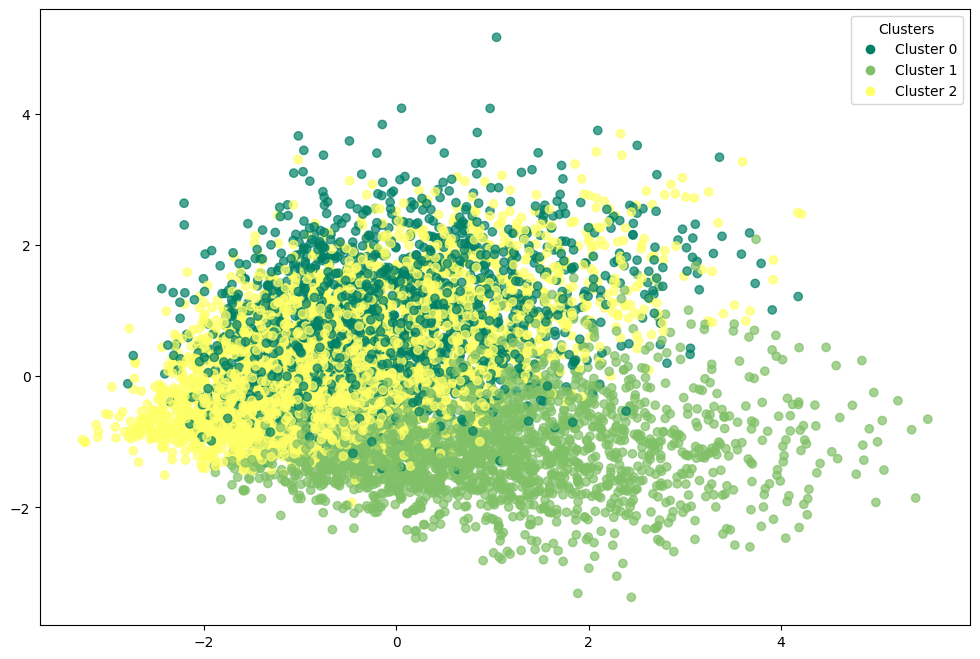

In [85]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 1], df_pca_kmeans.iloc[:, 2], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [86]:
df_pca_kmeans.groupby(df_pca_kmeans['kmeans_pca']).mean() 

,dim_1,dim_2,dim_3
kmeans_pca,,,
0,2.151843,-0.125099,0.830561
1,0.232668,0.967618,-1.054308
2,-1.360515,-0.564877,0.225809


In [87]:
energy_scaled['kmeans_pca'] = df_pca_kmeans['kmeans_pca']

In [88]:
energy_scaled.groupby(energy_scaled['kmeans_pca']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_pca,,,,,,,,,,
0,-0.444209,0.504237,0.564475,1.422387,1.372683,-0.298450,-0.004131,-0.139230,-0.704139,-0.315380
1,-0.542152,0.667752,0.750266,-0.426643,-0.346726,-0.254499,0.081668,0.208646,0.549893,0.365781
2,0.605170,-0.721300,-0.809269,-0.518344,-0.542898,0.334556,-0.051284,-0.058796,0.034304,-0.063061


In [89]:
energy_scaled.drop('kmeans_pca',axis=1,inplace=True)

In [90]:
sil = silhouette_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])
ch = calinski_harabasz_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])
db = davies_bouldin_score(df_pca_kmeans.iloc[:,:-1], df_pca_kmeans['kmeans_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.32680609377924563
Calinski-Harabasz: 3526.9288669775437
Davies-Bouldin: 1.1548582220149992


### k-means with t-SNE

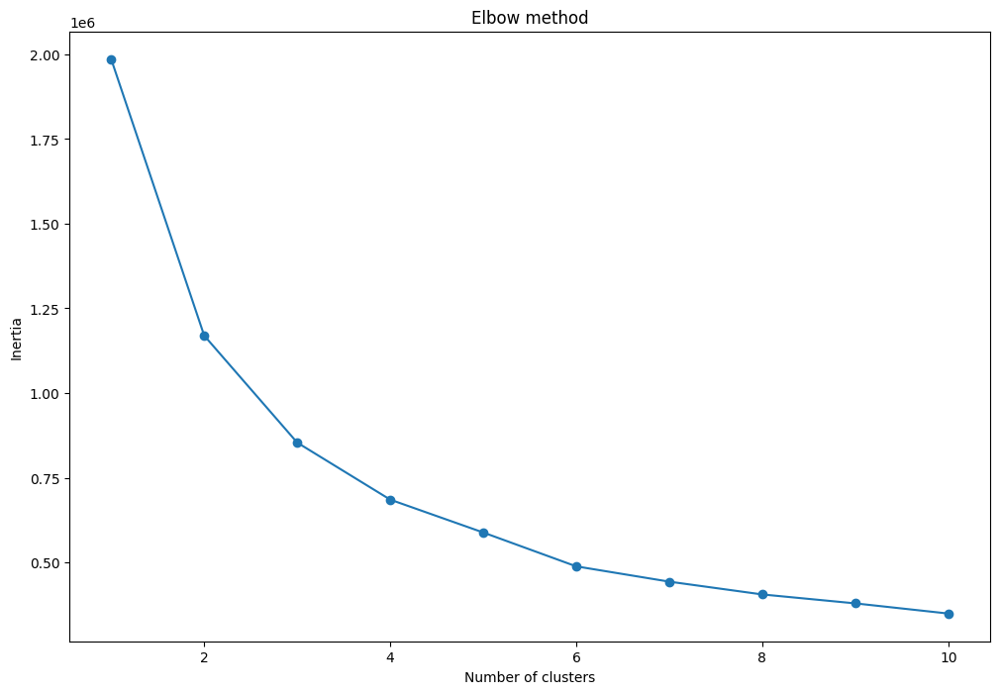

In [91]:
data = X_tsne
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [92]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [93]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [94]:
df_tsne_kmeans = X_tsne.copy()

In [95]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [96]:
df_tsne_kmeans

,dim_1,dim_2,dim_3,kmeans_tsne
0,2.536473,-0.569887,9.241193,2
1,-4.466090,7.754672,-10.270030,0
2,-11.023314,11.286777,-2.401266,1
3,2.220190,8.093020,-1.315360,0
4,11.463785,9.571602,4.114413,2
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,1
7088,-8.877161,-0.713788,7.598481,1
7089,-6.021173,-15.945735,-2.919369,1
7090,-5.589542,-12.948777,-2.492481,1


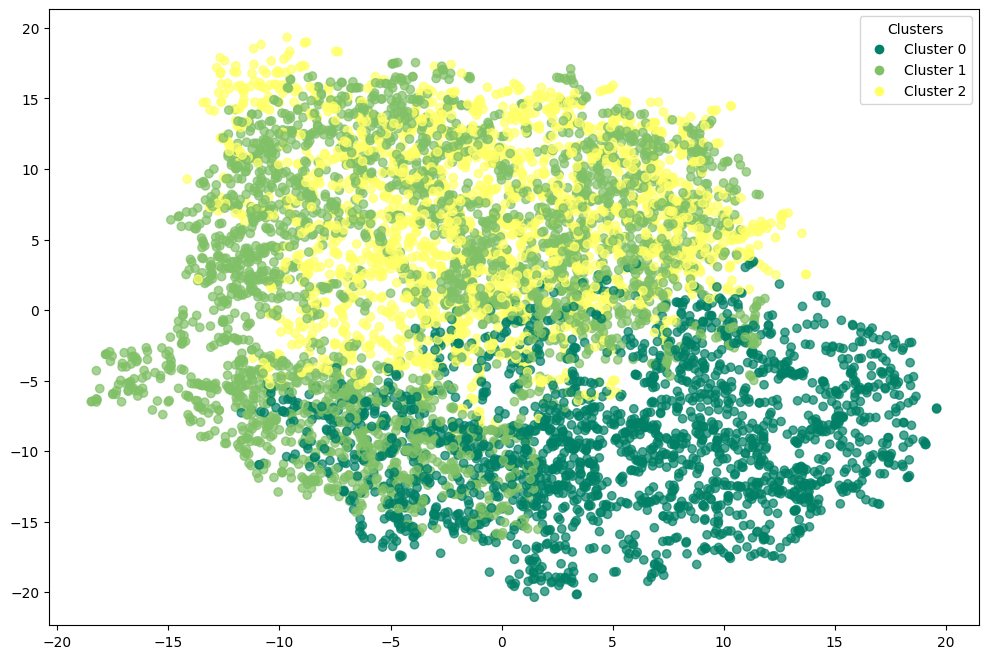

In [97]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 1], df_tsne_kmeans.iloc[:, 2], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [98]:
df_tsne_kmeans.groupby(df_tsne_kmeans['kmeans_tsne']).mean()

,dim_1,dim_2,dim_3
kmeans_tsne,,,
0,5.016039,5.256064,-9.097964
1,-12.024409,-3.154827,2.099170
2,12.169019,-0.748427,6.089001


In [99]:
energy_scaled['kmeans_tsne'] = df_tsne_kmeans['kmeans_tsne']

In [100]:
energy_scaled.groupby(energy_scaled['kmeans_tsne']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_tsne,,,,,,,,,,
0,-0.568839,0.659929,0.764399,-0.478505,-0.316311,-0.266838,0.070074,0.121424,0.393478,0.158333
1,0.628505,-0.759869,-0.835231,-0.549400,-0.580623,0.384273,-0.039776,0.018470,0.152673,0.036832
2,-0.366514,0.471714,0.478364,1.323912,1.204372,-0.307348,-0.011848,-0.152845,-0.635826,-0.218604


In [101]:
energy_scaled.drop('kmeans_tsne',axis=1,inplace=True)

In [102]:
sil = silhouette_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])
ch = calinski_harabasz_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])
db = davies_bouldin_score(df_tsne_kmeans.iloc[:,:-1], df_tsne_kmeans['kmeans_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.35521697998046875
Calinski-Harabasz: 4701.371364579547
Davies-Bouldin: 1.0415154186897153


### k-means with umap

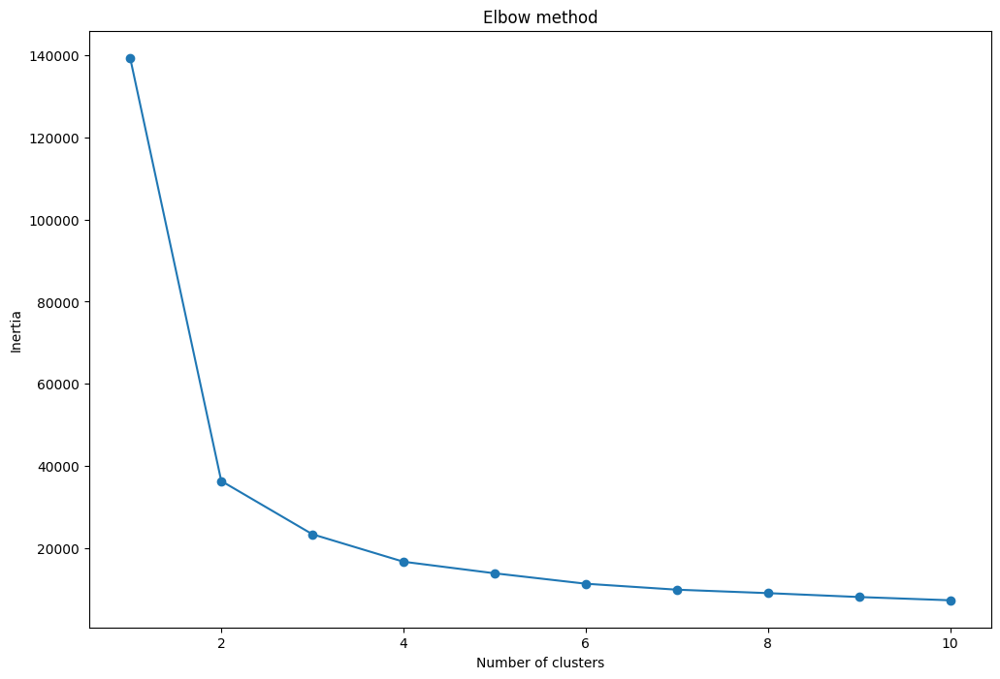

In [103]:
data = X_umap
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(12,8))
plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [104]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [105]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [106]:
df_umap_kmeans = X_umap.copy()

In [107]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [108]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


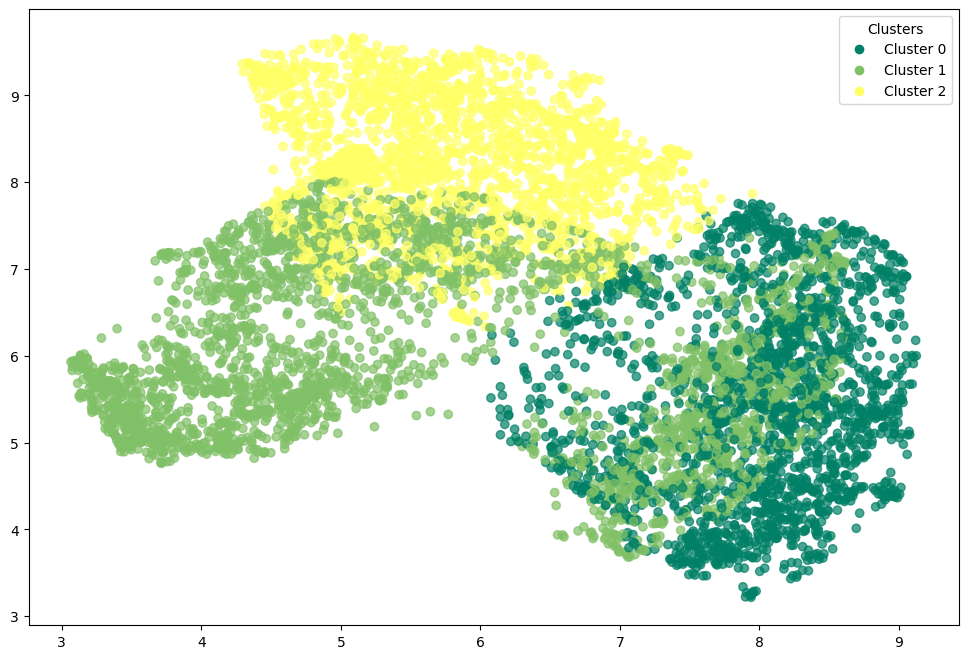

In [109]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 1], df_umap_kmeans.iloc[:, 2], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [110]:
energy_scaled['kmeans_umap'] = df_umap_kmeans['kmeans_umap']

In [111]:
energy_scaled.groupby(energy_scaled['kmeans_umap']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
kmeans_umap,,,,,,,,,,
0,-0.567043,0.666037,0.756206,-0.525852,-0.412623,-0.230381,0.082459,0.079564,0.421733,0.176370
1,0.650506,-0.756840,-0.857066,-0.551149,-0.582912,0.344307,-0.052747,0.027710,0.168249,0.045323
2,-0.397730,0.456947,0.515650,1.262404,1.203158,-0.274659,-0.001298,-0.112326,-0.625590,-0.226241


In [112]:
energy_scaled.drop('kmeans_umap',axis=1,inplace=True)

In [113]:
sil = silhouette_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])
ch = calinski_harabasz_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])
db = davies_bouldin_score(df_umap_kmeans.iloc[:,:-1], df_umap_kmeans['kmeans_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.5547354817390442
Calinski-Harabasz: 17548.105122976038
Davies-Bouldin: 0.6757137273027984


## Birch

In [114]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [115]:
birch.fit(energy_scaled)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [116]:
df_birch = energy_scaled.copy()

In [117]:
df_birch['birch'] = birch.labels_

In [118]:
df_birch

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,birch
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,0
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,1
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,2
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,0
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,0
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,0


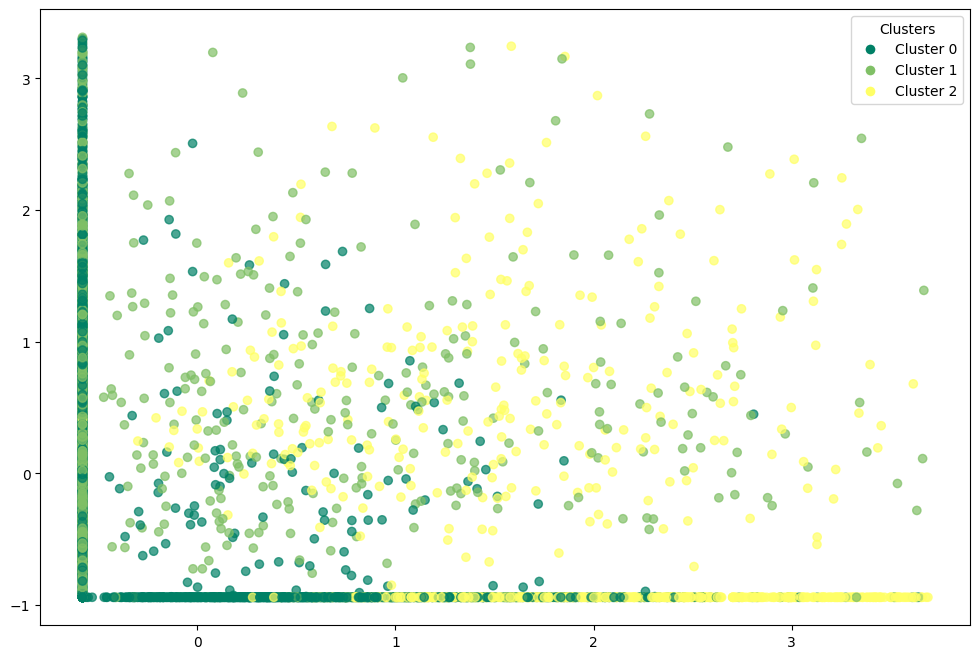

In [119]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [120]:
df_birch.groupby(df_birch['birch']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch,,,,,,,,,,
0,-0.204936,-0.224276,-0.096485,-0.461014,-0.492653,0.207692,0.056223,0.040150,0.244185,0.137949
1,-0.415405,0.501443,0.460967,0.826529,0.876565,-0.346461,-0.124831,-0.233466,-0.510073,-0.368333
2,1.786267,-0.527472,-0.863674,-0.554007,-0.574665,0.182341,0.129960,0.467529,0.481127,0.479969


In [121]:
sil = silhouette_score(df_birch.iloc[:,:-1], df_birch['birch'])
ch = calinski_harabasz_score(df_birch.iloc[:,:-1], df_birch['birch'])
db = davies_bouldin_score(df_birch.iloc[:,:-1], df_birch['birch'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.10809580511187006
Calinski-Harabasz: 948.7499923932447
Davies-Bouldin: 2.338280167949605


### Birch with pca

In [122]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [123]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [124]:
df_pca_birch = X_pca.copy()

In [125]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [126]:
df_pca_birch

,dim_1,dim_2,dim_3,birch_pca
0,0.886679,1.363975,1.186636,1
1,-0.110236,-0.167015,-0.663318,0
2,-0.966315,2.136664,0.196361,0
3,0.073670,0.551620,-0.449555,0
4,1.649792,1.775372,1.256657,1
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


In [127]:
energy_scaled['birch_pca'] = df_pca_birch['birch_pca']

In [128]:
energy_scaled.groupby(energy_scaled['birch_pca']).mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_pca,,,,,,,,,,
0,-0.537923,0.644998,0.661348,-0.429260,-0.351460,-0.288789,-0.052173,0.007236,0.359212,0.126351
1,-0.395373,0.499818,0.581819,1.422949,1.375486,-0.265018,0.134048,-0.014730,-0.633337,-0.170150
2,0.637711,-0.780242,-0.842014,-0.544074,-0.572924,0.374316,-0.042567,0.003565,0.117672,0.009518


In [129]:
energy_scaled.drop('birch_pca',axis=1,inplace=True)

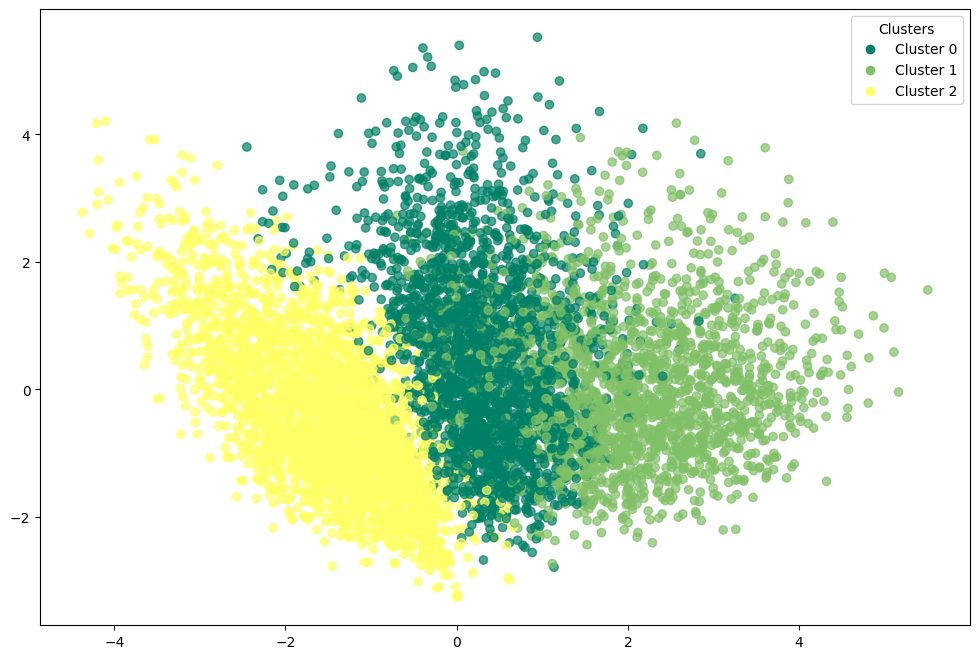

In [130]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_birch.iloc[:, 0], df_pca_birch.iloc[:, 1], 
                      c=df_pca_birch['birch_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_birch['birch_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [131]:
sil = silhouette_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])
ch = calinski_harabasz_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])
db = davies_bouldin_score(df_pca_birch.iloc[:,:-1], df_pca_birch['birch_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.306640537925367
Calinski-Harabasz: 3341.4258353654254
Davies-Bouldin: 1.2256561617555422


### Birch with t-SNE

In [132]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [133]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [134]:
df_tsne_birch = X_tsne.copy()

In [135]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [136]:
df_tsne_birch

,dim_1,dim_2,dim_3,birch_tsne
0,2.536473,-0.569887,9.241193,1
1,-4.466090,7.754672,-10.270030,2
2,-11.023314,11.286777,-2.401266,0
3,2.220190,8.093020,-1.315360,2
4,11.463785,9.571602,4.114413,1
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,0
7088,-8.877161,-0.713788,7.598481,0
7089,-6.021173,-15.945735,-2.919369,0
7090,-5.589542,-12.948777,-2.492481,0


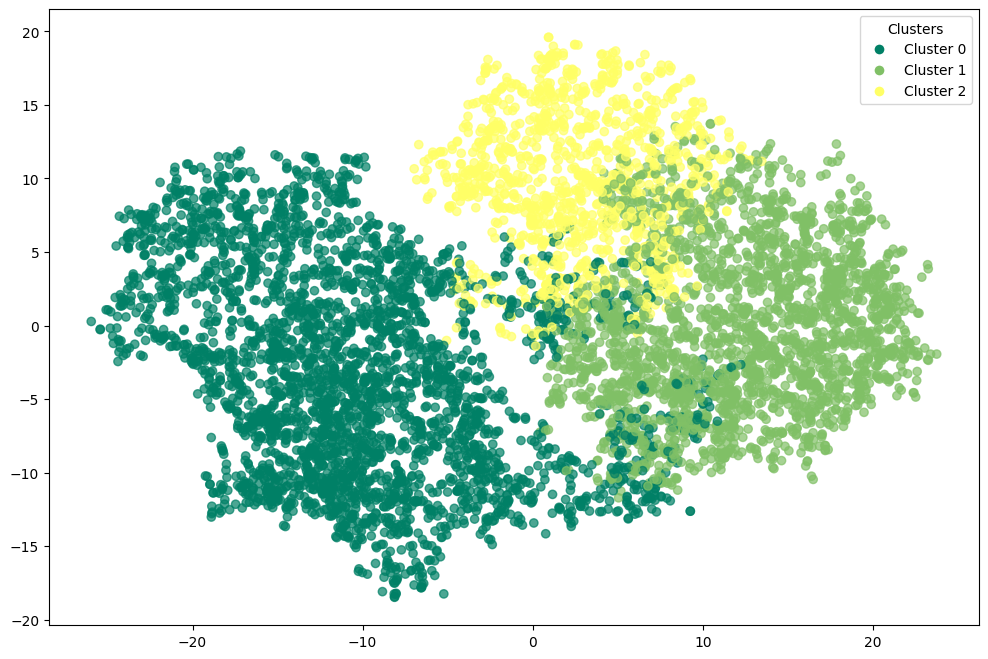

In [137]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [138]:
energy_scaled['birch_tsne'] = df_tsne_birch['birch_tsne']

In [139]:
energy_scaled.groupby('birch_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_tsne,,,,,,,,,,
0,0.602839,-0.631466,-0.782185,-0.446531,-0.432078,0.295024,-0.002768,-0.017022,0.088623,0.016226
1,-0.555360,0.518946,0.595579,0.872172,0.844814,-0.318915,-0.122544,-0.207560,-0.505350,-0.322307
2,-0.569234,0.726028,0.996927,-0.530724,-0.515349,-0.181182,0.261149,0.477450,0.792003,0.619904


In [140]:
energy_scaled.drop('birch_tsne',axis=1,inplace=True)

In [141]:
sil = silhouette_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])
ch = calinski_harabasz_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])
db = davies_bouldin_score(df_tsne_birch.iloc[:,:-1], df_tsne_birch['birch_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.30123600363731384
Calinski-Harabasz: 3681.541721916829
Davies-Bouldin: 1.0683106314278403


### Birch with umap

In [142]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [143]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [144]:
df_umap_birch = X_umap.copy()

In [145]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [146]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap
0,8.540884,5.635366,8.092696,0
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


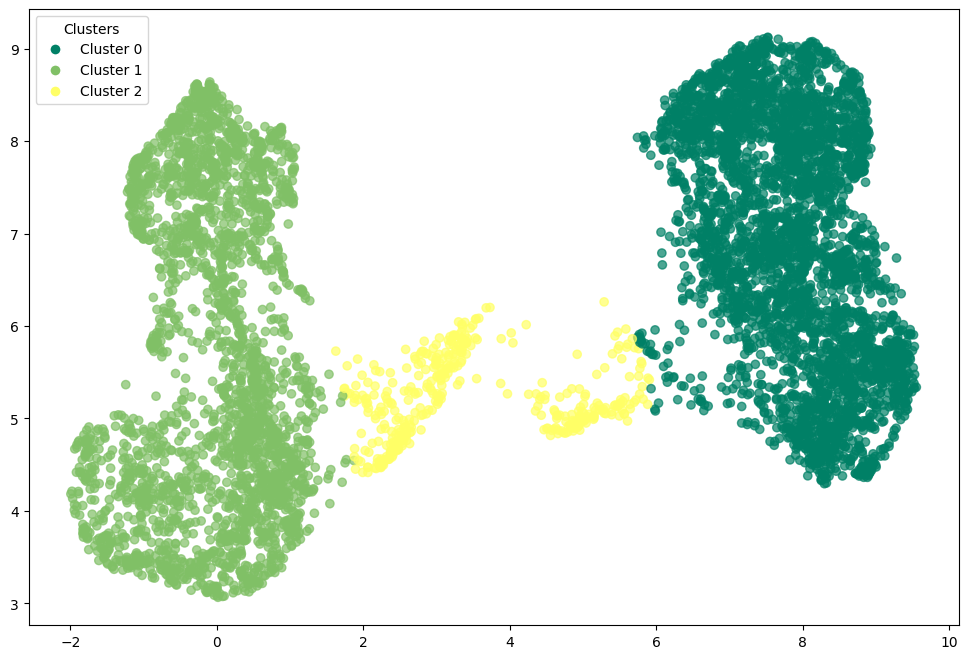

In [147]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [148]:
energy_scaled['birch_umap'] = df_umap_birch['birch_umap']

In [149]:
energy_scaled.groupby('birch_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
birch_umap,,,,,,,,,,
0,-0.551353,0.561411,0.683450,0.382821,0.403683,-0.249378,0.039116,-0.022900,-0.105745,-0.042368
1,0.589369,-0.909608,-0.857370,-0.555345,-0.588648,0.405565,-0.040315,0.042619,0.151480,0.052689
2,1.395089,0.710188,-0.856385,0.037394,0.060351,-0.325916,-0.109287,-0.066938,0.002898,0.056256


In [150]:
energy_scaled.drop('birch_umap',axis=1,inplace=True)

In [151]:
sil = silhouette_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])
ch = calinski_harabasz_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])
db = davies_bouldin_score(df_umap_birch.iloc[:,:-1], df_umap_birch['birch_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.42067408561706543
Calinski-Harabasz: 11420.16051713034
Davies-Bouldin: 0.7924389753143749


## GMM - Gaussian Mixture Models

In [152]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [153]:
gmm.fit(energy_scaled)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [154]:
df_gmm = energy_scaled.copy()

In [155]:
df_gmm['gmm'] = gmm.predict(energy_scaled)

In [156]:
df_gmm

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,gmm
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,1
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,1
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,1
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,1
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


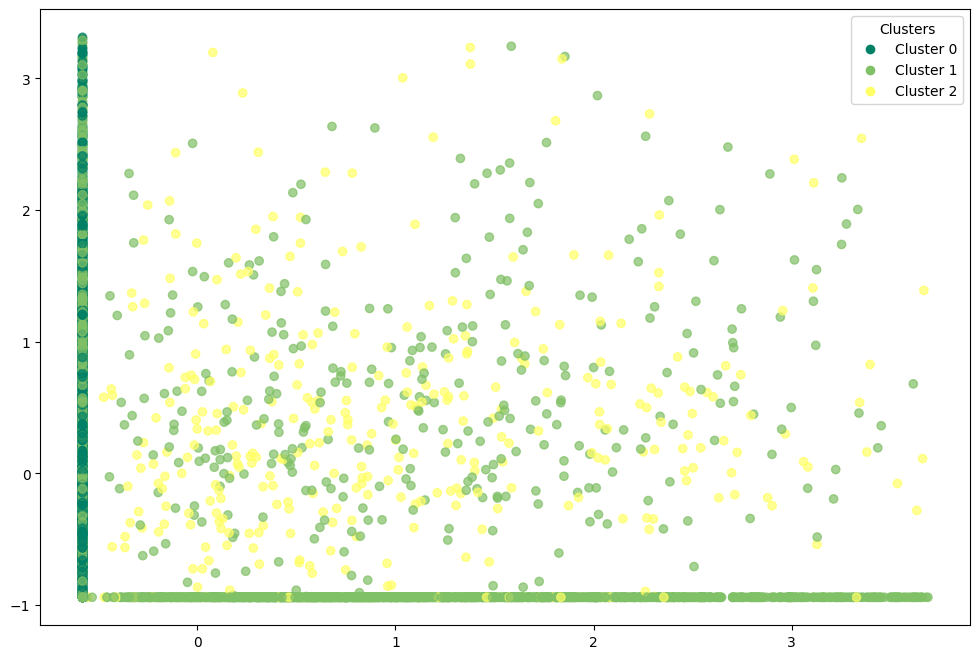

In [157]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [158]:
energy_scaled['gmm'] = df_gmm['gmm']

In [159]:
energy_scaled.groupby('gmm').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm,,,,,,,,,,
0,-0.579643,0.475849,0.660634,0.990584,1.006261,-0.283647,0.004527,-0.078973,-0.458656,-0.237318
1,0.219581,-0.270923,-0.279259,-0.572128,-0.610013,0.156834,-0.009666,0.056189,0.277601,0.135120
2,0.988913,0.215189,-0.798599,0.540218,0.875358,-0.075496,0.082343,-0.162890,-0.393952,-0.107366


In [160]:
energy_scaled.drop('gmm',axis=1,inplace=True)

In [161]:
sil = silhouette_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])
ch = calinski_harabasz_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])
db = davies_bouldin_score(df_gmm.iloc[:,:-1], df_gmm['gmm'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.11668271176663823
Calinski-Harabasz: 824.2102026413606
Davies-Bouldin: 2.4536366237406253


### GMM with pca

In [162]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [163]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [164]:
df_pca_gmm = X_pca.copy()

In [165]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [166]:
df_pca_gmm

,dim_1,dim_2,dim_3,gmm_pca
0,0.886679,1.363975,1.186636,0
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,2
7088,-1.573662,0.599975,0.321832,2
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


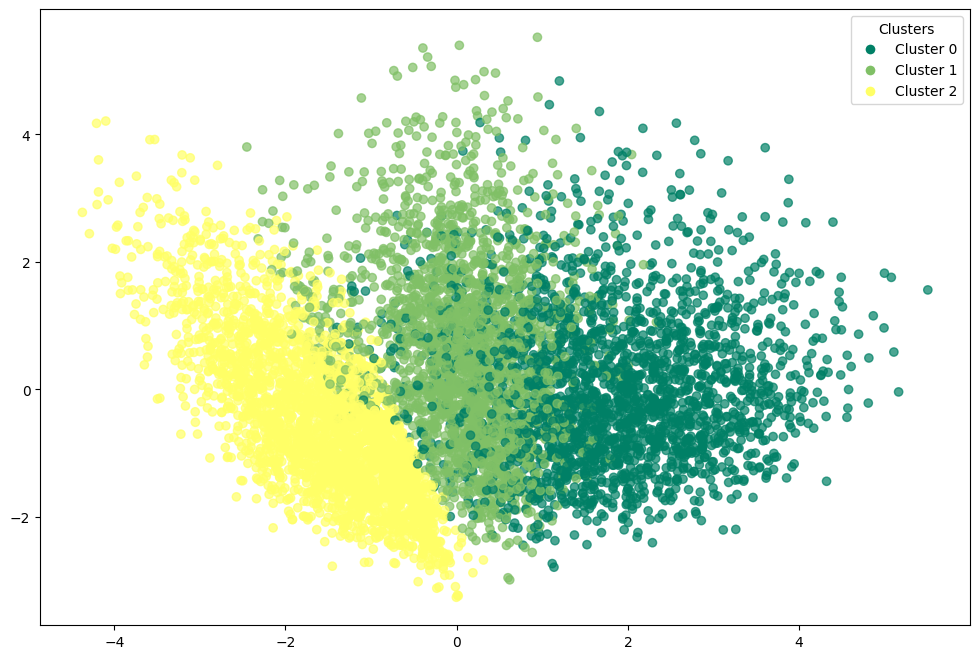

In [167]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [168]:
energy_scaled['gmm_pca'] = df_pca_gmm['gmm_pca']

In [169]:
energy_scaled.groupby('gmm_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_pca,,,,,,,,,,
0,-0.386586,0.477908,0.535778,1.180385,1.174310,-0.257928,0.101483,-0.047707,-0.571930,-0.194134
1,-0.511295,0.575878,0.558897,-0.531597,-0.482015,-0.278265,-0.048021,0.070880,0.495300,0.233049
2,0.700317,-0.823434,-0.857848,-0.562490,-0.594870,0.419908,-0.046615,-0.014460,0.093537,-0.017138


In [170]:
energy_scaled.drop('gmm_pca',axis=1,inplace=True)

In [171]:
sil = silhouette_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])
ch = calinski_harabasz_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])
db = davies_bouldin_score(df_pca_gmm.iloc[:,:-1], df_pca_gmm['gmm_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.29202472608798163
Calinski-Harabasz: 3166.6450920387692
Davies-Bouldin: 1.2324138614610565


### GMM with t-SNE

In [172]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [173]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [174]:
df_tsne_gmm = X_tsne.copy()

In [175]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [176]:
df_tsne_gmm

,dim_1,dim_2,dim_3,gmm_tsne
0,2.536473,-0.569887,9.241193,2
1,-4.466090,7.754672,-10.270030,0
2,-11.023314,11.286777,-2.401266,1
3,2.220190,8.093020,-1.315360,0
4,11.463785,9.571602,4.114413,2
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,1
7088,-8.877161,-0.713788,7.598481,1
7089,-6.021173,-15.945735,-2.919369,1
7090,-5.589542,-12.948777,-2.492481,1


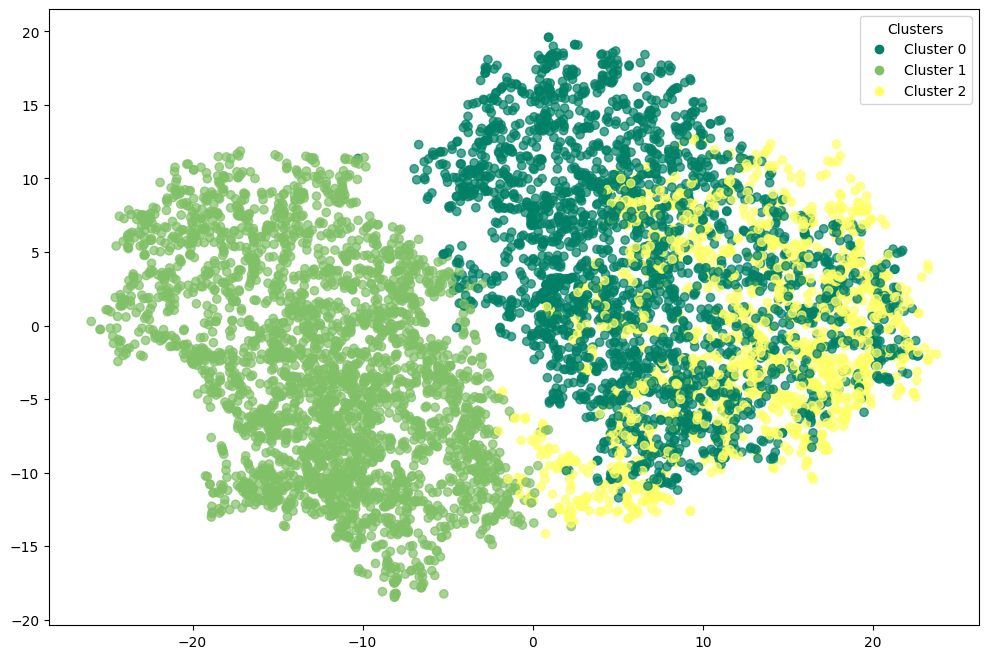

In [177]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [178]:
energy_scaled['gmm_tsne'] = df_tsne_gmm['gmm_tsne']

In [179]:
energy_scaled.groupby('gmm_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_tsne,,,,,,,,,,
0,-0.567072,0.605656,0.697847,-0.232069,-0.160219,-0.303690,0.046347,0.030994,0.166860,0.066127
1,0.627778,-0.774030,-0.836793,-0.549411,-0.579772,0.386285,-0.057557,0.028603,0.151655,0.033190
2,-0.264274,0.502126,0.461641,1.604146,1.533190,-0.247890,0.034870,-0.119162,-0.636564,-0.195124


In [180]:
energy_scaled.drop('gmm_tsne',axis=1,inplace=True)

In [181]:
sil = silhouette_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])
ch = calinski_harabasz_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])
db = davies_bouldin_score(df_tsne_gmm.iloc[:,:-1], df_tsne_gmm['gmm_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.33784914016723633
Calinski-Harabasz: 4381.5467931688445
Davies-Bouldin: 1.0745763625876272


### GMM with umap

In [182]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [183]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [184]:
df_umap_gmm = X_umap.copy()

In [185]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [186]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


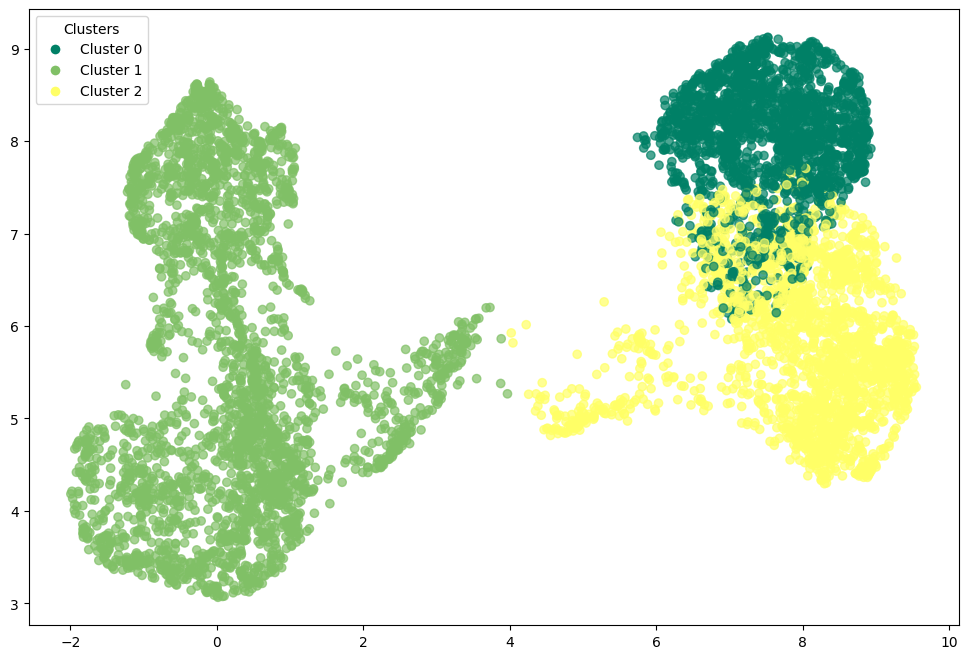

In [187]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [188]:
energy_scaled['gmm_umap'] = df_umap_gmm['gmm_umap']

In [189]:
energy_scaled.groupby('gmm_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
gmm_umap,,,,,,,,,,
0,-0.568088,0.657721,0.735372,-0.526835,-0.474128,-0.227031,0.068967,0.072351,0.387407,0.183041
1,0.650989,-0.755828,-0.857073,-0.550703,-0.582662,0.343719,-0.052991,0.027109,0.167397,0.044934
2,-0.402639,0.469103,0.541064,1.220015,1.218116,-0.276243,0.012938,-0.100576,-0.569235,-0.221804


In [190]:
energy_scaled.drop('gmm_umap',axis=1,inplace=True)

In [191]:
sil = silhouette_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])
ch = calinski_harabasz_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])
db = davies_bouldin_score(df_umap_gmm.iloc[:,:-1], df_umap_gmm['gmm_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.5536862015724182
Calinski-Harabasz: 17487.66455651591
Davies-Bouldin: 0.6766737846465243


## pam

In [192]:
initial_medoids = np.random.choice(len(energy_scaled),N_CLUSTER,replace=False)

In [193]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [194]:
pam = kmedoids(energy_scaled.values.tolist(),initial_medoids,metric=metric)

In [195]:
pam.process()

In [196]:
clusters = pam.get_clusters()

In [197]:
medoids = pam.get_medoids()

In [198]:
labels = np.zeros(len(energy_scaled))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [199]:
df_pam = energy_scaled.copy()

In [200]:
df_pam['pam'] = labels

In [201]:
df_pam

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,pam
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,2.0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,2.0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,2.0
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,2.0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,1.0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,0.0
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,0.0
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,0.0
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,0.0


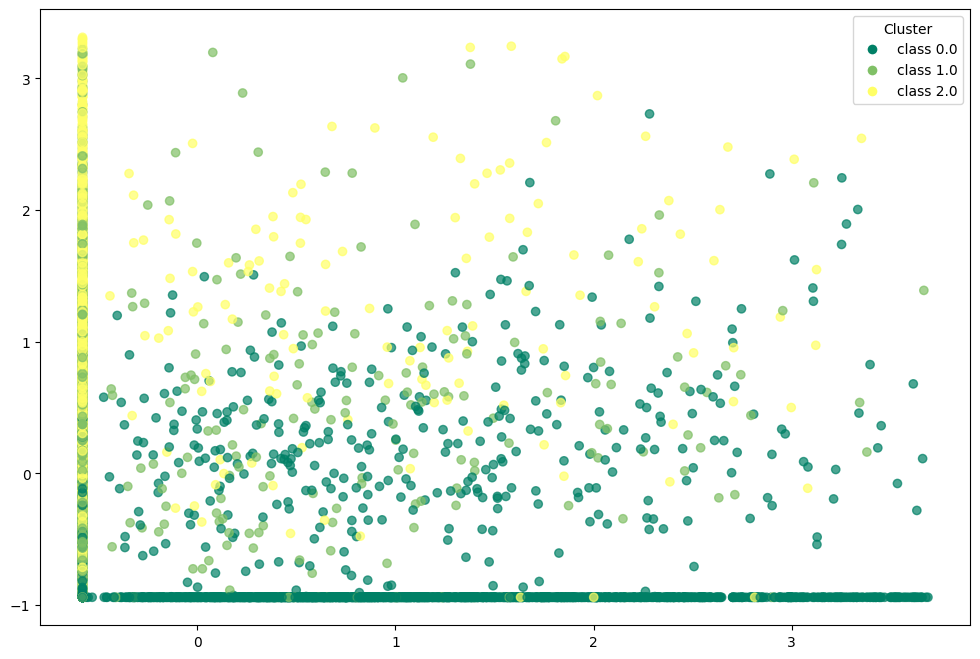

In [202]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [203]:
energy_scaled['pam'] = df_pam['pam']

In [204]:
energy_scaled.groupby('pam').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam,,,,,,,,,,
0.0,0.566757,-0.741788,-0.795196,-0.513141,-0.535063,0.308569,-0.096948,-0.123921,-0.009479,-0.111063
1.0,-0.430355,0.489358,0.529940,1.510999,1.443911,-0.315636,-0.038141,-0.162836,-0.707941,-0.310057
2.0,-0.472065,0.671923,0.716387,-0.393014,-0.313491,-0.197510,0.162515,0.291198,0.531113,0.381055


In [205]:
energy_scaled.drop('pam',axis=1,inplace=True)

In [206]:
sil = silhouette_score(df_pam.iloc[:,:-1], df_pam['pam'])
ch = calinski_harabasz_score(df_pam.iloc[:,:-1], df_pam['pam'])
db = davies_bouldin_score(df_pam.iloc[:,:-1], df_pam['pam'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.185652372572026
Calinski-Harabasz: 1503.9765598872966
Davies-Bouldin: 1.8781787492114759


### pam with pca

In [207]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [208]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [209]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [210]:
pam_pca.process()

In [211]:
clusters = pam_pca.get_clusters()

In [212]:
medoids = pam_pca.get_medoids()

In [213]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [214]:
df_pam_pca = X_pca.copy()

In [215]:
df_pam_pca['pam_pca'] = labels

In [216]:
df_pam_pca

,dim_1,dim_2,dim_3,pam_pca
0,0.886679,1.363975,1.186636,0.0
1,-0.110236,-0.167015,-0.663318,2.0
2,-0.966315,2.136664,0.196361,2.0
3,0.073670,0.551620,-0.449555,2.0
4,1.649792,1.775372,1.256657,0.0
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,1.0
7088,-1.573662,0.599975,0.321832,1.0
7089,-0.416653,-2.763515,-0.690737,1.0
7090,-0.618345,-2.158439,-0.582987,1.0


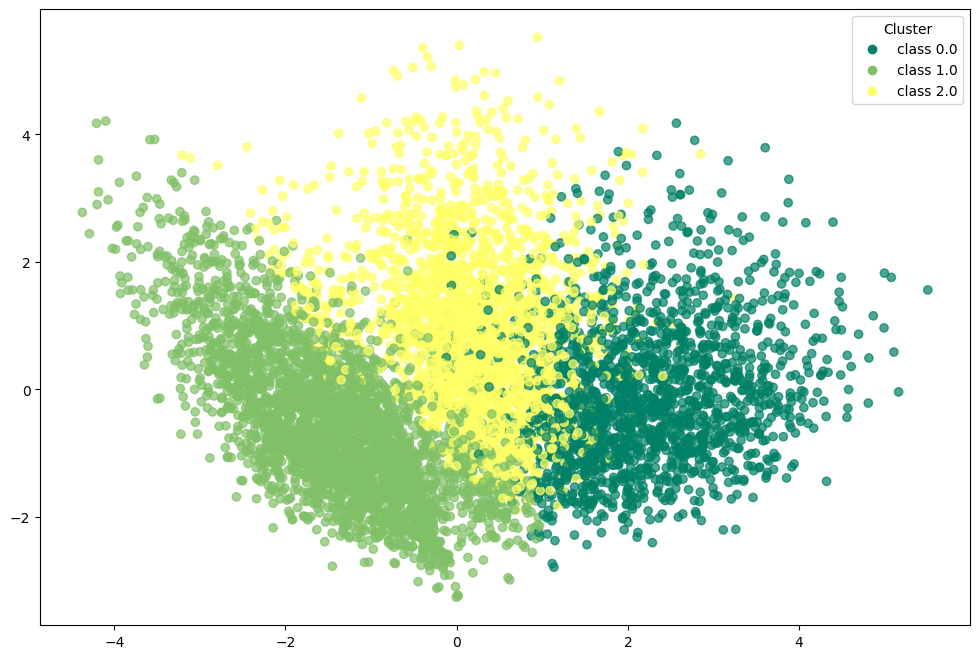

In [217]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [218]:
energy_scaled['pam_pca'] = df_pam_pca['pam_pca']

In [219]:
energy_scaled.groupby('pam_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_pca,,,,,,,,,,
0.0,-0.449466,0.528335,0.594002,1.468602,1.415267,-0.296652,0.009147,-0.120588,-0.704530,-0.306019
1.0,0.607466,-0.723623,-0.808702,-0.508215,-0.533643,0.339330,-0.062735,-0.081432,0.012913,-0.086348
2.0,-0.525659,0.631738,0.703223,-0.419638,-0.340882,-0.257778,0.083604,0.212712,0.535489,0.365687


In [220]:
energy_scaled.drop('pam_pca',axis=1,inplace=True)

In [221]:
sil = silhouette_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])
ch = calinski_harabasz_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])
db = davies_bouldin_score(df_pam_pca.iloc[:,:-1], df_pam_pca['pam_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.3243252936369891
Calinski-Harabasz: 3513.926809724108
Davies-Bouldin: 1.1689683060036415


### pam with t-SNE

In [222]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [223]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [224]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [225]:
pam_tsne.process()

In [226]:
clusters = pam_tsne.get_clusters()

In [227]:
medoids = pam_tsne.get_medoids()

In [228]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [229]:
df_pam_tsne = X_tsne.copy()

In [230]:
df_pam_tsne['pam_tsne'] = labels

In [231]:
df_pam_tsne

,dim_1,dim_2,dim_3,pam_tsne
0,2.536473,-0.569887,9.241193,2.0
1,-4.466090,7.754672,-10.270030,1.0
2,-11.023314,11.286777,-2.401266,0.0
3,2.220190,8.093020,-1.315360,1.0
4,11.463785,9.571602,4.114413,2.0
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,0.0
7088,-8.877161,-0.713788,7.598481,0.0
7089,-6.021173,-15.945735,-2.919369,0.0
7090,-5.589542,-12.948777,-2.492481,0.0


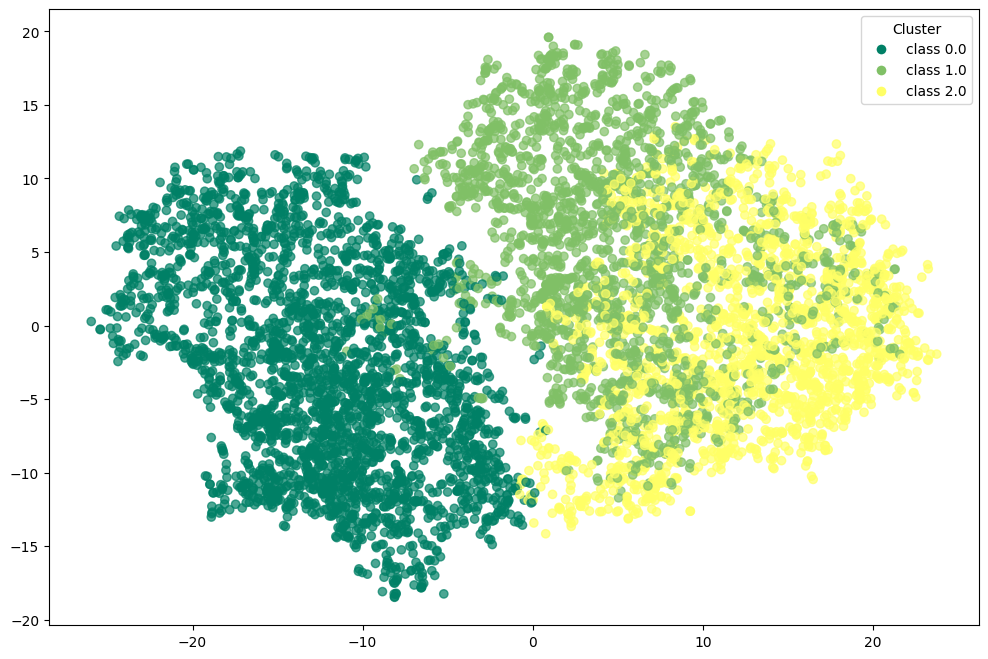

In [232]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [233]:
energy_scaled['pam_tsne'] = df_pam_tsne['pam_tsne']

In [234]:
energy_scaled.groupby('pam_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_tsne,,,,,,,,,,
0.0,0.632112,-0.765666,-0.834480,-0.549630,-0.580398,0.390072,-0.033846,0.005944,0.157581,0.035025
1.0,-0.568777,0.642503,0.752966,-0.471785,-0.315585,-0.268776,0.072078,0.140523,0.388067,0.169543
2.0,-0.358031,0.482072,0.470468,1.318244,1.201758,-0.306604,-0.024202,-0.155365,-0.641368,-0.229340


In [235]:
energy_scaled.drop('pam_tsne',axis=1,inplace=True)

In [236]:
sil = silhouette_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])
ch = calinski_harabasz_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])
db = davies_bouldin_score(df_pam_tsne.iloc[:,:-1], df_pam_tsne['pam_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.35445618629455566
Calinski-Harabasz: 4696.87727691005
Davies-Bouldin: 1.043425083166926


### pam with umap

In [237]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [238]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [239]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [240]:
pam_umap.process()

In [241]:
clusters = pam_umap.get_clusters()

In [242]:
medoids = pam_umap.get_medoids()

In [243]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [244]:
df_pam_umap = X_umap.copy()

In [245]:
df_pam_umap['pam_umap'] = labels

In [246]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap
0,8.540884,5.635366,8.092696,0.0
1,6.674550,7.703112,4.661761,1.0
2,8.055438,8.882436,5.173176,1.0
3,7.841428,6.987625,5.274173,1.0
4,9.224665,5.318230,7.319454,0.0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,2.0
7088,0.870373,5.136365,5.973392,2.0
7089,-0.109102,8.384296,7.264081,2.0
7090,-0.318984,7.911990,6.649530,2.0


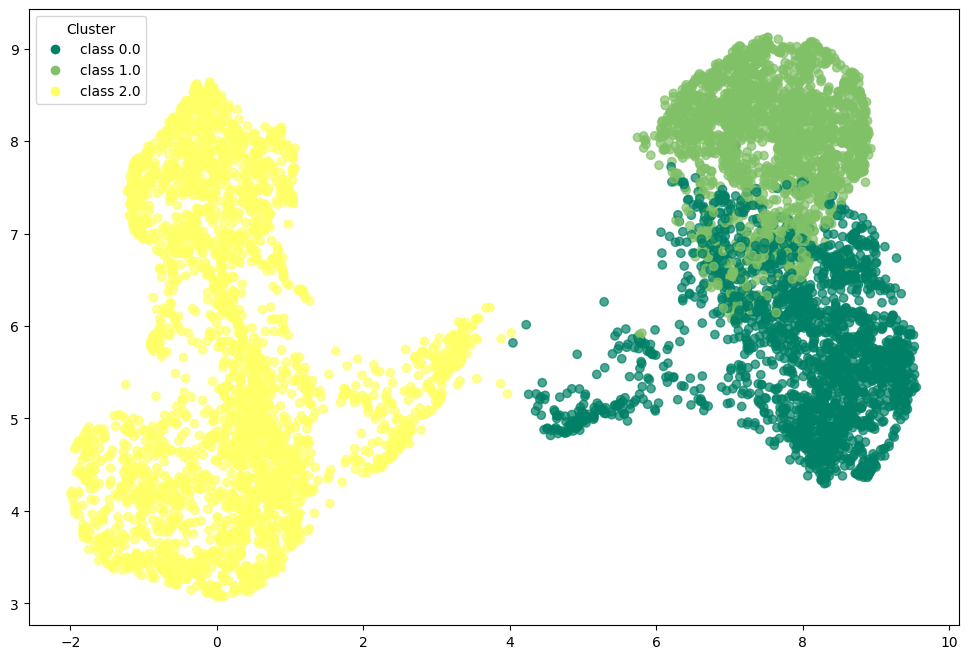

In [247]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [248]:
energy_scaled['pam_umap'] = df_pam_umap['pam_umap']

In [249]:
energy_scaled.groupby('pam_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
pam_umap,,,,,,,,,,
0.0,-0.397950,0.457368,0.522177,1.282932,1.212908,-0.279353,-0.002378,-0.106691,-0.630872,-0.223309
1.0,-0.566799,0.662808,0.748349,-0.523363,-0.400468,-0.225440,0.083432,0.072655,0.414851,0.168885
2.0,0.650861,-0.755534,-0.857076,-0.550449,-0.582518,0.343343,-0.053278,0.026595,0.166975,0.044591


In [250]:
energy_scaled.drop('pam_umap',axis=1,inplace=True)

In [251]:
sil = silhouette_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])
ch = calinski_harabasz_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])
db = davies_bouldin_score(df_pam_umap.iloc[:,:-1], df_pam_umap['pam_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.5547025799751282
Calinski-Harabasz: 17539.663009337113
Davies-Bouldin: 0.6761954888085175


## spectral clustering

In [252]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [253]:
spectral_clustering.fit(energy_scaled)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [254]:
df_spectral = energy_scaled.copy()

In [255]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [256]:
df_spectral

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI,spectral_clustering
0,-0.579643,0.148608,1.300140,1.746476,0.743712,2.809316,-0.145830,-0.117412,0.879062,0.832694,0
1,-0.579643,-0.715316,0.065661,-0.572128,0.406721,-0.784830,0.980805,-0.718128,1.516077,-1.184406,0
2,-0.579643,1.352837,0.559952,-0.572128,-0.610013,3.296398,1.972302,-0.592196,1.186382,1.092885,0
3,-0.579643,0.015821,0.489051,-0.572128,-0.610013,-0.601795,0.830882,1.210436,-0.541078,-0.429612,0
4,-0.579643,0.473696,0.364209,1.827655,0.791109,-0.830605,1.184085,0.492971,-0.741086,2.127921,0
...,...,...,...,...,...,...,...,...,...,...,...
7087,1.775882,-0.941587,-0.866919,-0.572128,-0.610013,-0.635243,0.627956,1.447397,-0.105264,2.109170,2
7088,0.605725,-0.941587,-0.866919,-0.572128,-0.610013,-0.830605,1.001797,1.033588,0.441445,0.362106,2
7089,-0.342551,-0.941587,-0.866919,-0.572128,-0.610013,-0.113951,-1.023599,-1.641473,-0.934753,-1.233887,1
7090,-0.579643,-0.941587,-0.866919,-0.572128,-0.610013,0.274152,-0.751304,-1.124245,-0.510324,-1.089488,1


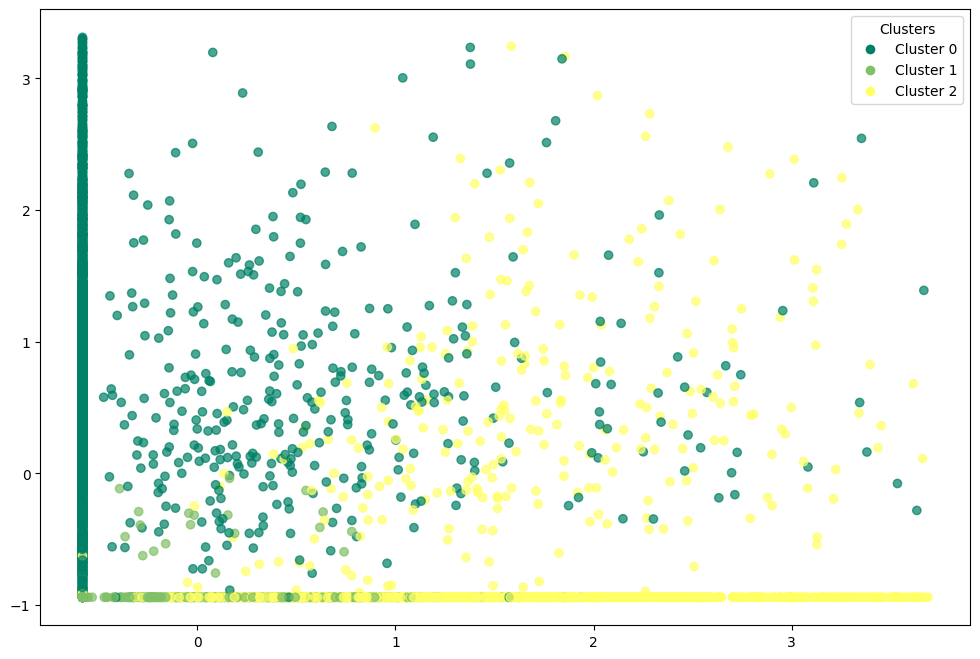

In [257]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [258]:
energy_scaled['spectral_clustering'] = df_spectral['spectral_clustering']

In [259]:
energy_scaled.groupby('spectral_clustering').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_clustering,,,,,,,,,,
0,-0.466616,0.565590,0.597611,0.383549,0.406707,-0.272598,0.035542,-0.024959,-0.108562,-0.036957
1,-0.345550,-0.926029,-0.856207,-0.560870,-0.593617,-0.392999,-0.584005,-0.258068,-0.128360,-0.262596
2,1.293117,-0.726761,-0.844322,-0.534792,-0.567781,0.874909,0.282998,0.218924,0.330835,0.249451


In [260]:
energy_scaled.drop('spectral_clustering',axis=1,inplace=True)

In [261]:
sil = silhouette_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])
ch = calinski_harabasz_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])
db = davies_bouldin_score(df_spectral.iloc[:,:-1], df_spectral['spectral_clustering'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.07888103126765093
Calinski-Harabasz: 1124.0206121124959
Davies-Bouldin: 1.7808505177468528


### spectral clustering with pca

In [262]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [263]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [264]:
df_pca_spectral = X_pca.copy()

In [265]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [266]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca
0,0.886679,1.363975,1.186636,1
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,1
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,0
7088,-1.573662,0.599975,0.321832,0
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


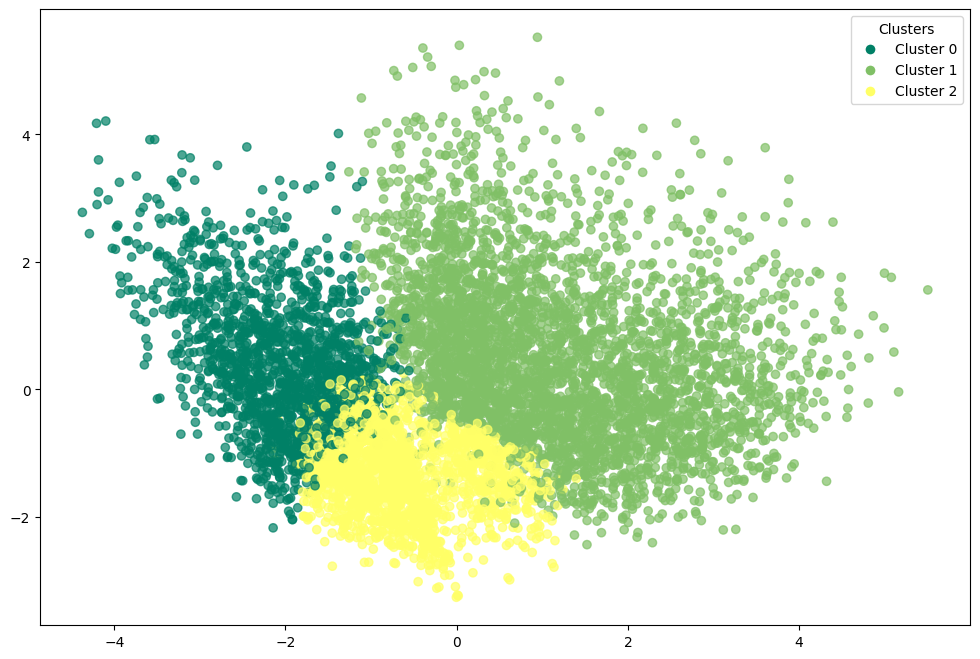

In [267]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [268]:
energy_scaled['spectral_pca'] = df_pca_spectral['spectral_pca']

In [269]:
energy_scaled.groupby('spectral_pca').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_pca,,,,,,,,,,
0,1.209227,-0.764546,-0.839961,-0.549552,-0.584267,0.831947,0.435875,0.507415,0.581757,0.566316
1,-0.474375,0.627160,0.721830,0.506613,0.521628,-0.265046,0.097464,0.079395,-0.063640,0.070046
2,-0.087388,-0.564963,-0.682872,-0.511879,-0.512018,-0.176352,-0.540315,-0.564431,-0.353979,-0.594764


In [270]:
energy_scaled.drop('spectral_pca',axis=1,inplace=True)

In [271]:
sil = silhouette_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])
ch = calinski_harabasz_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])
db = davies_bouldin_score(df_pca_spectral.iloc[:,:-1], df_pca_spectral['spectral_pca'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.2497695597688974
Calinski-Harabasz: 2863.759826688352
Davies-Bouldin: 1.1063566177219695


In [272]:
df_pca_spectral

,dim_1,dim_2,dim_3,spectral_pca
0,0.886679,1.363975,1.186636,1
1,-0.110236,-0.167015,-0.663318,1
2,-0.966315,2.136664,0.196361,1
3,0.073670,0.551620,-0.449555,1
4,1.649792,1.775372,1.256657,1
...,...,...,...,...
7087,-2.202718,1.358424,1.035535,0
7088,-1.573662,0.599975,0.321832,0
7089,-0.416653,-2.763515,-0.690737,2
7090,-0.618345,-2.158439,-0.582987,2


### spectral clustering with t-SNE

In [273]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [274]:
spectral_tsne.fit(X_tsne)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [275]:
df_tsne_spectral = X_tsne.copy()

In [276]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [277]:
df_tsne_spectral

,dim_1,dim_2,dim_3,spectral_tsne
0,2.536473,-0.569887,9.241193,0
1,-4.466090,7.754672,-10.270030,0
2,-11.023314,11.286777,-2.401266,1
3,2.220190,8.093020,-1.315360,0
4,11.463785,9.571602,4.114413,0
...,...,...,...,...
7087,-9.545277,-2.896458,16.773628,1
7088,-8.877161,-0.713788,7.598481,1
7089,-6.021173,-15.945735,-2.919369,2
7090,-5.589542,-12.948777,-2.492481,2


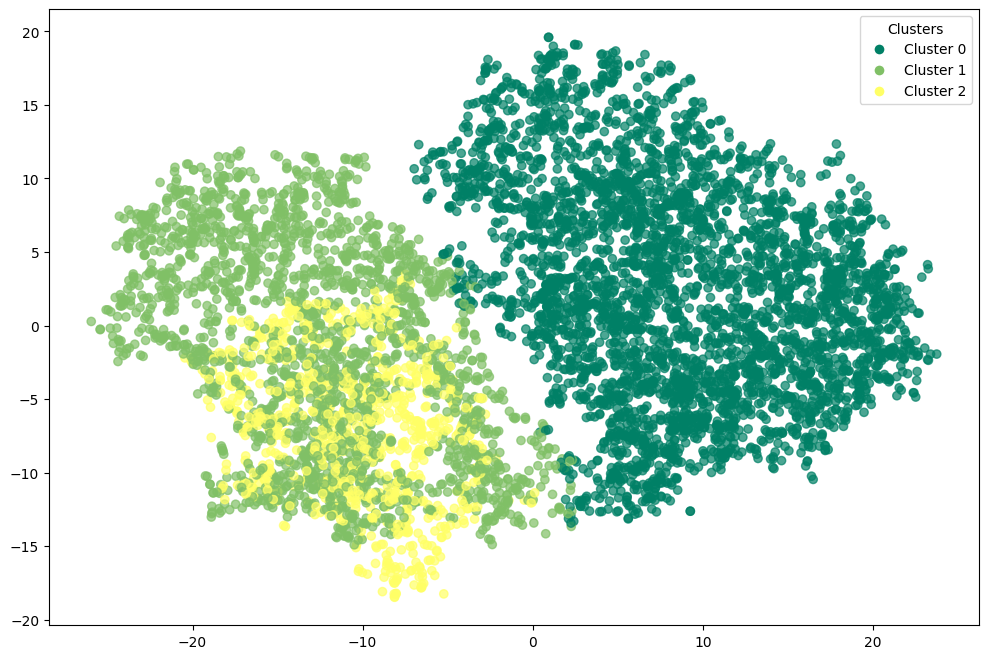

In [278]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [279]:
energy_scaled['spectral_tsne'] = df_tsne_spectral['spectral_tsne']

In [280]:
energy_scaled.groupby('spectral_tsne').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_tsne,,,,,,,,,,
0,-0.478529,0.554744,0.633398,0.414776,0.437149,-0.286719,0.046998,-0.018474,-0.119912,-0.022828
1,1.127220,-0.651504,-0.832787,-0.544462,-0.571995,0.701811,0.162570,0.065093,0.235654,0.093337
2,-0.528679,-0.924403,-0.846874,-0.556642,-0.590969,-0.378743,-0.589218,-0.071029,-0.022658,-0.118040


In [281]:
energy_scaled.drop('spectral_tsne',axis=1,inplace=True)

In [282]:
sil = silhouette_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])
ch = calinski_harabasz_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])
db = davies_bouldin_score(df_tsne_spectral.iloc[:,:-1], df_tsne_spectral['spectral_tsne'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.29897797107696533
Calinski-Harabasz: 3394.3494784659697
Davies-Bouldin: 1.0489689712179076


### spectral clustering with umap

In [283]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [284]:
spectral_umap.fit(X_umap)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [285]:
df_umap_spectral = X_umap.copy()

In [286]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [287]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap
0,8.540884,5.635366,8.092696,0
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,0
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


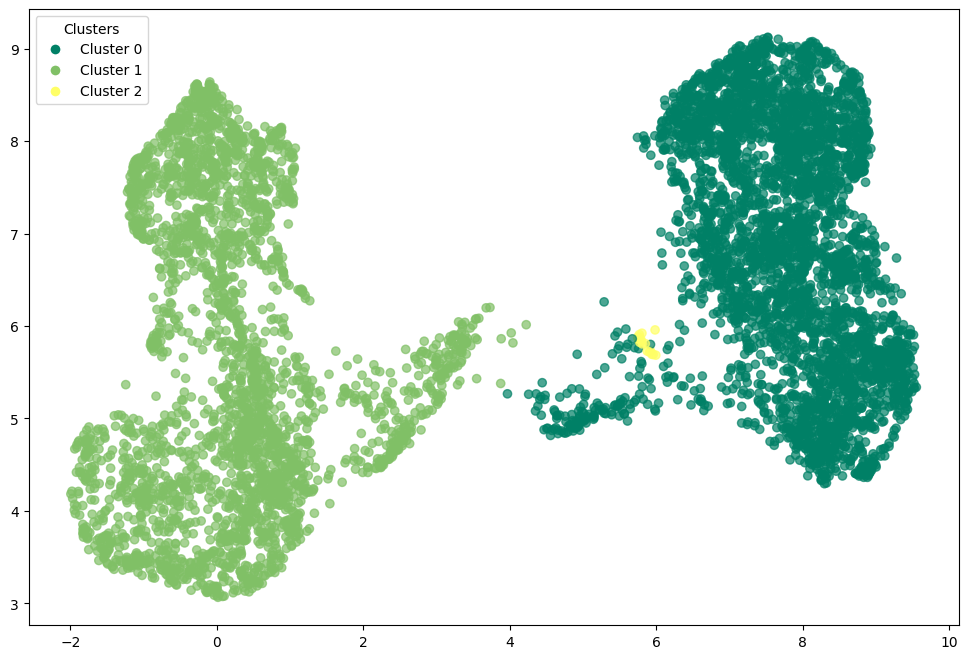

In [288]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [289]:
energy_scaled['spectral_umap'] = df_umap_spectral['spectral_umap']

In [290]:
energy_scaled.groupby('spectral_umap').mean()

,Tot_waterheat_elec_EUI,Tot_heating_gas_EUI,Tot_waterheat_gas_EUI,Tot_cooking_gas_EUI,Tot_appliances_gas_EUI,Tot_heating_elec_EUI,Tot_cooling_elec_EUI,Tot_refrigeretor_elec_EUI,Tot_cooking_elec_EUI,Tot_appliances_elec_EUI
spectral_umap,,,,,,,,,,
0,-0.479342,0.561732,0.634380,0.410415,0.432761,-0.267722,0.039775,-0.018346,-0.120382,-0.029044
1,0.650350,-0.755769,-0.857079,-0.550228,-0.582255,0.343067,-0.053274,0.026055,0.166652,0.044059
2,-0.579643,-0.278658,0.222358,-0.497836,-0.213569,2.712211,-0.055883,-0.197562,-0.645995,-0.735641


In [291]:
energy_scaled.drop('spectral_umap',axis=1,inplace=True)

In [292]:
sil = silhouette_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])
ch = calinski_harabasz_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])
db = davies_bouldin_score(df_umap_spectral.iloc[:,:-1], df_umap_spectral['spectral_umap'])

print("Silhouette:", sil)
print("Calinski-Harabasz:", ch)
print("Davies-Bouldin:", db)

Silhouette: 0.23793433606624603
Calinski-Harabasz: 10064.900941197036
Davies-Bouldin: 0.8980833822152977


# internal measures

Internal validation metrics evaluate clustering **without requiring ground truth labels**, based on cohesion (how close points are within a cluster) and separation (how far clusters are from each other).

---

## Silhouette Score

The **Silhouette Score** measures how similar a point is to its own cluster compared to other clusters.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to points in **other clusters** (nearest cluster separation).  
3. Silhouette score `s(i)`:
   \[
   s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}
   \]
4. Overall score = average `s(i)` across all points.

**Interpretation:**
- `s ≈ 1` → point is well-clustered  
- `s ≈ 0` → point near cluster boundary  
- `s < 0` → point may be misclassified

**Strengths**
- Works without ground truth  
- Measures both cohesion and separation  
- Useful for estimating the optimal number of clusters  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to distance metric choice  

---

## Davies–Bouldin Index (DBI)

The **Davies–Bouldin Index** evaluates clustering based on **average similarity between clusters**. It quantifies the ratio of intra-cluster distance to inter-cluster separation.

1. For each cluster `i`, compute **average intra-cluster distance** `S_i`.  
2. For each pair of clusters `(i, j)`, compute **inter-cluster distance** `M_ij` between centroids.  
3. Compute the ratio `R_ij = (S_i + S_j) / M_ij`.  
4. For each cluster `i`, take `R_i = max_j R_ij`.  
5. DBI = average of all `R_i`.

**Interpretation:**
- **Lower DBI** → better clustering (clusters are compact and well-separated)  
- **Higher DBI** → clusters are overlapping or poorly separated

**Strengths**
- Does not require ground truth  
- Considers both cluster compactness and separation  

**Weaknesses**
- Sensitive to cluster shape and scale  
- Can favor algorithms that produce more clusters  

---

## Calinski–Harabasz Index (Variance Ratio Criterion)

The **Calinski–Harabasz Index (CH Index)** evaluates clustering using the **ratio of between-cluster dispersion to within-cluster dispersion**.

1. Compute **between-cluster dispersion** `B_k` (sum of squared distances between cluster centroids and overall mean).  
2. Compute **within-cluster dispersion** `W_k` (sum of squared distances of points to their cluster centroids).  
3. Compute the index:
\[
CH = \frac{B_k / (k-1)}{W_k / (n-k)}
\]
where `k` = number of clusters, `n` = number of points.

**Interpretation:**
- **Higher CH** → better clustering (dense and well-separated clusters)  
- Can be used to select the optimal number of clusters

**Strengths**
- Simple and fast to compute  
- Works without ground truth  
- Effective for convex, well-separated clusters  

**Weaknesses**
- Assumes clusters are roughly spherical  
- Sensitive to noise and outliers  

---

## Summary Table

| Metric | Ground Truth Required | Range | Meaning |
|--------|---------------------|-------|---------|
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-clustered, 0 = boundary, <0 = misclassified |
| **Davies–Bouldin Index** | ❌ | [0, ∞) | Lower is better (compact & separated clusters) |
| **Calinski–Harabasz Index** | ❌ | [0, ∞) | Higher is better (dense & well-separated clusters) |

In [293]:
results = {}

def evaluate_clustering(X, y_pred):

    scores = {
        "Silhouette": silhouette_score(X, y_pred),
        "Davies Bouldin": davies_bouldin_score(X, y_pred),
        "Calinski Harabasz": calinski_harabasz_score(X, y_pred),
        
    }
    return scores

def evaluate_and_store(name, X, y_pred):
    scores = evaluate_clustering(X, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",df_kmeans.drop(['k_means'],axis=1).values,df_kmeans['k_means'])

evaluate_and_store("k-means + pca",df_pca_kmeans.drop(['kmeans_pca'],axis=1).values,df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",df_tsne_kmeans.drop(['kmeans_tsne'],axis=1).values,df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",df_umap_kmeans.drop(['kmeans_umap'],axis=1).values,df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",df_birch.drop(['birch'],axis=1).values,df_birch['birch'])

evaluate_and_store("Birch + pca",df_pca_birch.drop(['birch_pca'],axis=1).values,df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",df_tsne_birch.drop(['birch_tsne'],axis=1).values,df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",df_umap_birch.drop(['birch_umap'],axis=1).values,df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",df_gmm.drop(['gmm'],axis=1).values,df_gmm['gmm'])

evaluate_and_store("GMM + pca",df_pca_gmm.drop(['gmm_pca'],axis=1).values,df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",df_tsne_gmm.drop(['gmm_tsne'],axis=1).values,df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",df_umap_gmm.drop(['gmm_umap'],axis=1).values,df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",df_pam.drop(['pam'],axis=1).values,df_pam['pam'])

evaluate_and_store("PAM + pca",df_pam_pca.drop(['pam_pca'],axis=1).values,df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",df_pam_tsne.drop(['pam_tsne'],axis=1).values,df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",df_pam_umap.drop(['pam_umap'],axis=1).values,df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",df_spectral.drop(['spectral_clustering'],axis=1).values,df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",df_pca_spectral.drop(['spectral_pca'],axis=1).values,df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",df_tsne_spectral.drop(['spectral_tsne'],axis=1).values,df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",df_umap_spectral.drop(['spectral_umap'],axis=1).values,df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                            Silhouette  Davies Bouldin  Calinski Harabasz
k-means                          0.180           1.850           1530.929
k-means + pca                    0.327           1.155           3526.929
k-means + tsne                   0.355           1.042           4701.371
k-means + umap                   0.555           0.676          17548.105
Birch                            0.108           2.338            948.750
Birch + pca                      0.307           1.226           3341.426
Birch + tsne                     0.301           1.068           3681.542
Birch + umap                     0.421           0.792          11420.161
GMM                              0.117           2.454            824.210
GMM + pca                        0.292           1.232           3166.645
GMM + tsne                       0.338           1.075           4381.547
GMM + umap                       0.554           0.677          17487.665
PAM                              0.186

In [294]:
df_results

,Silhouette,Davies Bouldin,Calinski Harabasz
k-means,0.180,1.850,1530.929
k-means + pca,0.327,1.155,3526.929
k-means + tsne,0.355,1.042,4701.371
k-means + umap,0.555,0.676,17548.105
Birch,0.108,2.338,948.750
Birch + pca,0.307,1.226,3341.426
Birch + tsne,0.301,1.068,3681.542
Birch + umap,0.421,0.792,11420.161
GMM,0.117,2.454,824.210
GMM + pca,0.292,1.232,3166.645


# working area

In [295]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap
0,8.540884,5.635366,8.092696,2
1,6.674550,7.703112,4.661761,0
2,8.055438,8.882436,5.173176,0
3,7.841428,6.987625,5.274173,0
4,9.224665,5.318230,7.319454,2
...,...,...,...,...
7087,0.898640,4.104914,6.800636,1
7088,0.870373,5.136365,5.973392,1
7089,-0.109102,8.384296,7.264081,1
7090,-0.318984,7.911990,6.649530,1


In [296]:
df_umap_kmeans['state'] = energy_complete['state_postal']

In [297]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,state
0,8.540884,5.635366,8.092696,2,NM
1,6.674550,7.703112,4.661761,0,NaN
2,8.055438,8.882436,5.173176,0,NaN
3,7.841428,6.987625,5.274173,0,SC
4,9.224665,5.318230,7.319454,2,NaN
...,...,...,...,...,...
7087,0.898640,4.104914,6.800636,1,NV
7088,0.870373,5.136365,5.973392,1,MT
7089,-0.109102,8.384296,7.264081,1,NaN
7090,-0.318984,7.911990,6.649530,1,FL


In [298]:
df_umap_kmeans.isna().sum()

dim_1             0
dim_2             0
dim_3             0
kmeans_umap       0
state          2415
dtype: int64

In [299]:
map = df_umap_kmeans.groupby('state')['kmeans_umap'].agg(lambda x: x.value_counts().idxmax()).reset_index(name='dominant_cluster')

In [300]:
map

,state,dominant_cluster
0,AK,1
1,AL,1
2,AR,1
3,AZ,1
4,CA,1
5,CO,1
6,CT,1
7,DC,2
8,DE,1
9,FL,1


In [301]:
import geopandas as gpd

url = "https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_20m.zip"
states = gpd.read_file(url)
merged = states.merge(map, left_on='STUSPS', right_on='state', how='left')

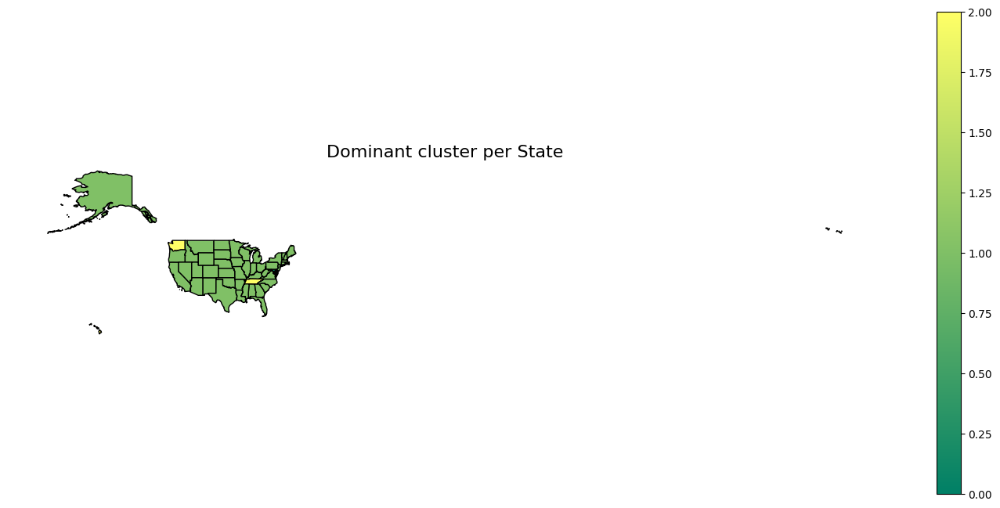

In [303]:
fig, ax = plt.subplots(figsize=(18, 8))
merged.plot(
    column='dominant_cluster',
    cmap='summer',
    legend=True,
    ax=ax,
    edgecolor='black',
)
plt.title('Dominant cluster per State', fontsize=16)
plt.axis('off')
plt.show()